In [1]:
## setting retina graphic output in jupyter notebook
%config InlineBackend.figure_format = 'retina'

In [2]:
import rasterio
from pyproj import Proj
import numpy as np

with rasterio.open(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping\moa125_2014_hp1_v01.tif") as raster:
    img_data = raster.read(1)  # Read the first band (assuming it's a single band image)
    img_x = np.linspace(raster.bounds.left, raster.bounds.right, raster.width)
    img_y = np.linspace(raster.bounds.top, raster.bounds.bottom, raster.height)
    stere_proj = Proj('+proj=stere +lat_0=-90 +lat_ts=-71 +lon_0=0 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs')
    #proj = Proj(raster.crs)
    #img_lon, img_lat = stere_proj(*np.meshgrid(img_x, img_y), inverse=True)


In [3]:
import obspy
from obspy import read_inventory, UTCDateTime
from obspy.clients.fdsn import Client
ap = Client('IRIS') # Iris client
# inv = read_inventory('METADATA/Antarctic_stations.xml')
inv = ap.get_stations(network='*', station="*", level='response', channel='HHZ,HHN,HHE', starttime=obspy.UTCDateTime(2010,1,1,1),
                      endtime = obspy.UTCDateTime(2024,1,1,1), maxlatitude=-63)
print(inv)

sta_lats = []
sta_lons = []
for i in range(len(inv)):
    for j in range(len(inv[i])):
        sta_lats.append(inv[i][j].latitude)
        sta_lons.append(inv[i][j].longitude)

print('Number of stations:', len(sta_lats))

KeyboardInterrupt: 

In [ ]:
inv_PIG = ap.get_stations(network='XC', station="PIG*", level='response', channel='*', starttime=obspy.UTCDateTime(2010,1,1,1),
                      endtime = obspy.UTCDateTime(2024,1,1,1), maxlatitude=-63)
print(inv_PIG)

Inventory created at 2025-09-29T09:41:44.519900Z
	Created by: IRIS WEB SERVICE: fdsnws-station | version: 1.1.52
		    http://service.iris.edu/fdsnws/station/1/query?starttime=2010-01-...
	Sending institution: IRIS-DMC (IRIS-DMC)
	Contains:
		Networks (1):
			XC
		Stations (5):
			XC.PIG1 (Pine Island Glacier drill camp C)
			XC.PIG2 (Pine Island Glacier down glacier of C)
			XC.PIG3 (Pine Island Glacier Seismic northeast of C)
			XC.PIG4 (Pine Island Glacier Seismic between A and C)
			XC.PIG5 (Pine Island Glacier Seismic near crevasse)
		Channels (100):
			XC.PIG1..ACE, XC.PIG1..HHZ, XC.PIG1..HHN, XC.PIG1..HHE, 
			XC.PIG1..LCE, XC.PIG1..LCQ, XC.PIG1..LHZ, XC.PIG1..LHN, 
			XC.PIG1..LHE, XC.PIG1..LOG, XC.PIG1..OCF, XC.PIG1..VCO, 
			XC.PIG1..VEA, XC.PIG1..VEC, XC.PIG1..VEP, XC.PIG1..VKI, 
			XC.PIG1..VMU, XC.PIG1..VMV, XC.PIG1..VMW, XC.PIG1..VPB, 
			XC.PIG2..ACE, XC.PIG2..HHZ, XC.PIG2..HHN, XC.PIG2..HHE, 
			XC.PIG2..LCE, XC.PIG2..LCQ, XC.PIG2..LHZ, XC.PIG2..LHN, 
			XC.PIG2..LHE, X

Station: PIG1, Channel: HHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG2, Channel: HHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG3, Channel: HHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG4, Channel: HHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG5, Channel: HHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]


c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\core\inventory\response.py:2318: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend(loc="lower center", ncol=3, fontsize='small')


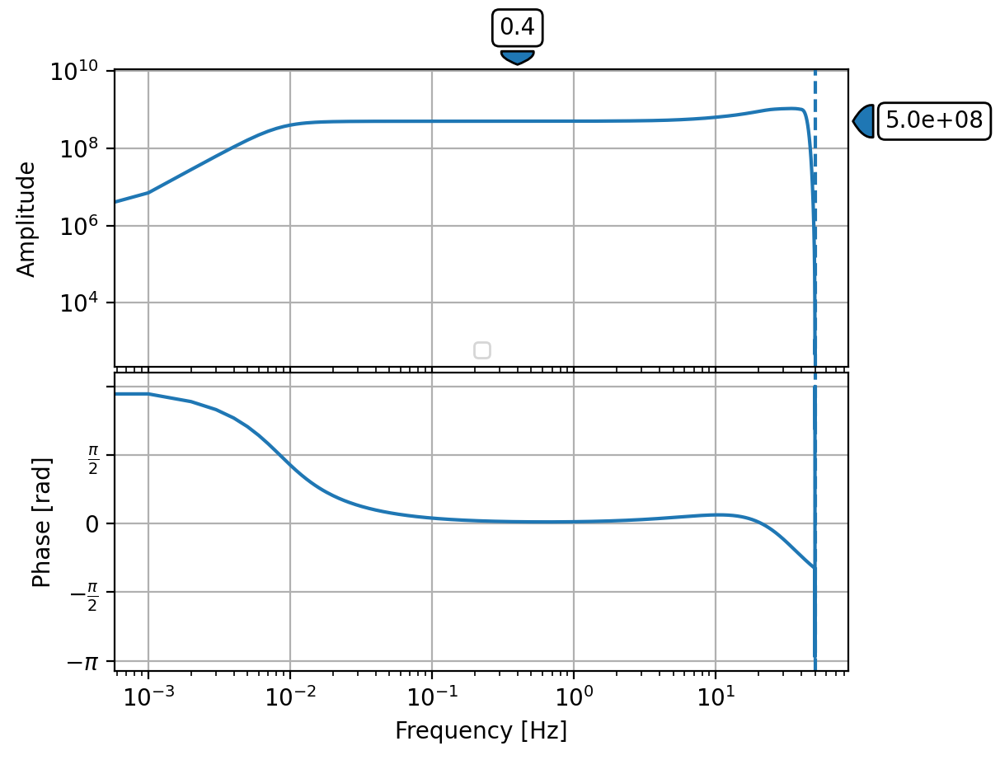

In [5]:
# for sta in inv.select(network='XC')[0]:


for net in inv.select(channel='HHZ'):
    if net.code == 'XC':
        for sta in net:
            if sta.code.startswith('PIG'):
                for chan in sta:
                    if chan.code.startswith('HH'):
                        response = chan.response
                        paz = response.get_paz()
                        print(f"Station: {sta.code}, Channel: {chan.code}")
                        print(f"Poles: {paz.poles}")
                        print(f"Zeros: {paz.zeros}")
                        # Use response.response_stages to get filter info
                        for stage in response.response_stages:
                            if hasattr(stage, 'filter_type'):
                                print(f"Filter type: {stage.filter_type}")
                                print(f"Corner frequency: {getattr(stage, 'corner_frequency', 'N/A')}")
responses = response.plot(0.001)


Station: PIG1, Channel: LHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG2, Channel: LHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG3, Channel: LHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG4, Channel: LHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]
Station: PIG5, Channel: LHZ
Poles: [(-0.03852+0.03658j), (-0.03852-0.03658j), (-178+0j), (-135+160j), (-135-160j), (-671+1154j), (-671-1154j)]
Zeros: [0j, 0j, (-90+0j), (-160.7+0j), (-3108+0j)]


c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\core\inventory\response.py:2318: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend(loc="lower center", ncol=3, fontsize='small')


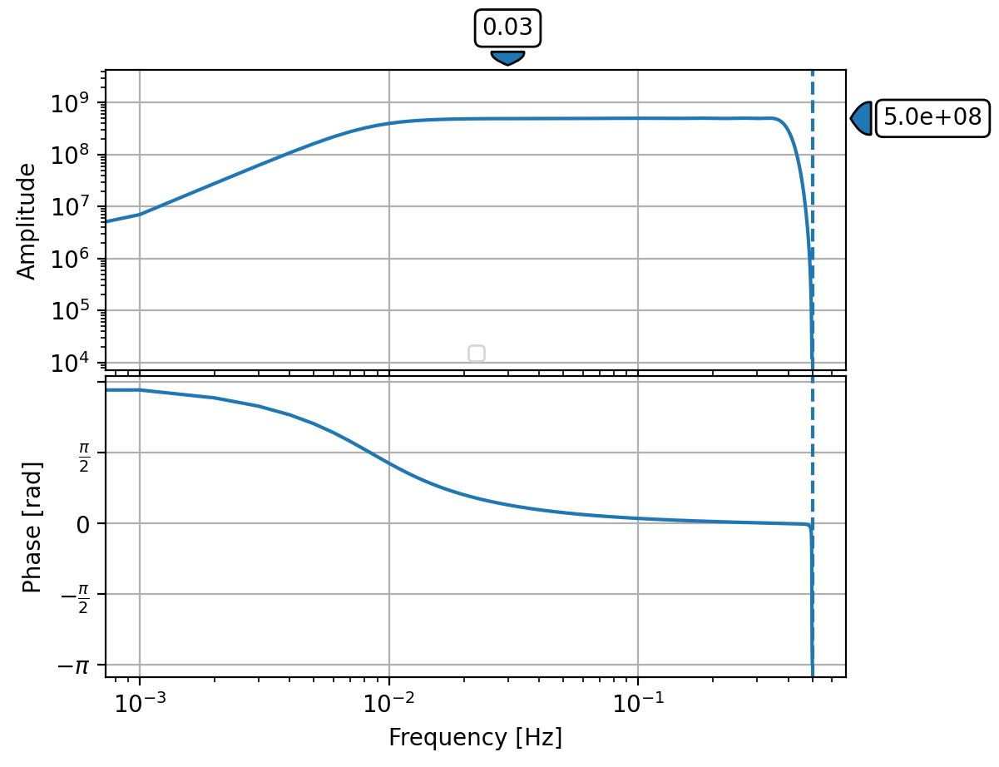

In [6]:
for net in inv_PIG.select(channel='LHZ'):
    if net.code == 'XC':
        for sta in net:
            if sta.code.startswith('PIG'):
                for chan in sta:
                    if chan.code.startswith('LH'):
                        response = chan.response
                        paz = response.get_paz()
                        print(f"Station: {sta.code}, Channel: {chan.code}")
                        print(f"Poles: {paz.poles}")
                        print(f"Zeros: {paz.zeros}")
                        # Use response.response_stages to get filter info
                        for stage in response.response_stages:
                            if hasattr(stage, 'filter_type'):
                                print(f"Filter type: {stage.filter_type}")
                                print(f"Corner frequency: {getattr(stage, 'corner_frequency', 'N/A')}")
responses = response.plot(0.001)

In [ ]:
import pandas as pd
pig_pd = pd.read_csv('PIG_events.csv', parse_dates=True)
pig_pd['relocated_time'] = [UTCDateTime(_) for _ in pig_pd['relocated_time']]

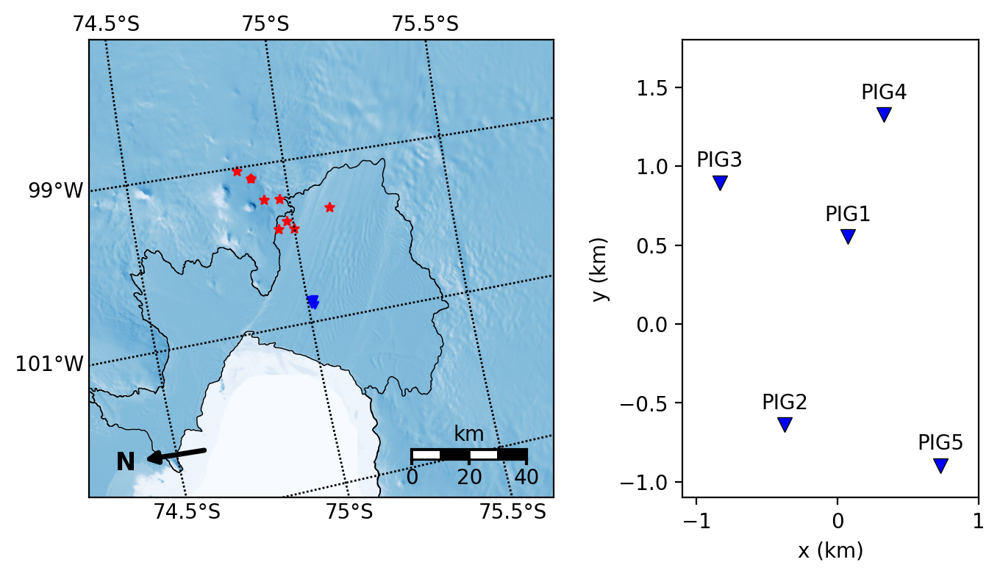

In [8]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

fig, ax = plt.subplots(1, 2, figsize=(7, 4), gridspec_kw={'width_ratios': [1, 0.6]})
m = Basemap(epsg=3031, llcrnrlon=-102.5, llcrnrlat=-74.2, urcrnrlon=-98, urcrnrlat=-75.9, ax=ax[0])
min_x, min_y = stere_proj(m.llcrnrlon, m.llcrnrlat)
max_x, max_y = stere_proj(m.urcrnrlon, m.urcrnrlat)
mask_x = (min_x <= img_x) & (img_x <= max_x)
mask_y = (min_y <= img_y) & (img_y <= max_y)

m.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=0.5, color='k', zorder=1)
m.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=0.5, color='k', zorder=1)
#m.readshapefile('METADATA/MOAAntarctica/moa2014_islands_v01_wgs84', 'islands', linewidth=0.5, color='k', zorder=1)
# m.pcolormesh(img_lon[mask_y, :][:, mask_x], img_lat[mask_y, :][:, mask_x], 
#              img_data[mask_y, :][:, mask_x], shading='auto', latlon=True, zorder=0, cmap='Blues')
# background topographic image
tmp = img_data[np.logical_and(min_y<=img_y, img_y<=max_y)][:, np.logical_and(min_x<=img_x, img_x<=max_x)]
m.imshow(tmp, cmap='Blues', origin='upper')


m.drawparallels(np.arange(-80, -70, .5), labels=[0, 0, 1, 1])
m.drawmeridians(np.arange(-105, -95, 2), labels=[1, 0, 0, 0])
m.ax.annotate('N', xy=m(-102.25, -74.6), xytext=m(-102.25, -74.3), fontsize=12, fontweight='bold',
              arrowprops=dict(arrowstyle='<|-', linewidth=2.5, color='k'))
m.drawmapscale(-103, -75.4, -101, -75, 40, barstyle='fancy', zorder=2, units='km', fontsize=10)

pig13 = pig_pd[[_.year == 2013 for _ in pig_pd.relocated_time]]
m.scatter(pig13.relocated_longitude, pig13.relocated_latitude, c='r', s=20, marker='*', latlon=True)
m.scatter(pig13.relocated_longitude.iloc[0], pig13.relocated_latitude.iloc[0], c='r', s=10, latlon=True)


for sta in inv.select(network='XC')[0]:
    m.scatter(sta.longitude, sta.latitude, c='b', s=10, latlon=True, marker='v')
    x, y = np.array(m(sta.longitude, sta.latitude)) / 1e3 - (78, 68)
    ax[1].plot(x, y, c='b', ms=7, marker='v', mec='k', mew=0.5)
    ax[1].text(x, y+.1, sta.code, ha='center')
ax[1].set(xlabel='x (km)', xlim=(-1.1, 1), ylabel='y (km)', ylim=(-1.1, 1.8))

fig.tight_layout()
plt.show()

In [9]:
# "C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping"
# 'DATA/Waveforms/XC_%s.mseed'

In [10]:
from obspy.clients.fdsn import Client
from pathlib import Path

for evtime in pig13.relocated_time:
    fname = Path(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping\XC_%s.mseed" % evtime.strftime('%Y%m%d%H%M%S'))
    if fname.exists():
        print(f"Waveform data for {evtime} already exists, skipping download.")
        continue
    dstream = Client("IRIS").get_waveforms(network='XC', station='PIG*', location='*', channel='HH?', starttime=evtime-60, endtime=evtime + 120, attach_response=True)
    dstream.detrend('linear')
    dstream.remove_response()
    dstream.write(fname, format='MSEED')

Waveform data for 2013-05-22T12:24:45.000000Z already exists, skipping download.
Waveform data for 2013-06-21T21:33:02.000000Z already exists, skipping download.
Waveform data for 2013-11-09T07:24:51.000000Z already exists, skipping download.
Waveform data for 2013-11-10T19:16:40.000000Z already exists, skipping download.
Waveform data for 2013-11-15T13:24:15.000000Z already exists, skipping download.
Waveform data for 2013-11-19T12:46:17.000000Z already exists, skipping download.
Waveform data for 2013-11-21T07:28:51.000000Z already exists, skipping download.
Waveform data for 2013-11-23T04:22:04.000000Z already exists, skipping download.


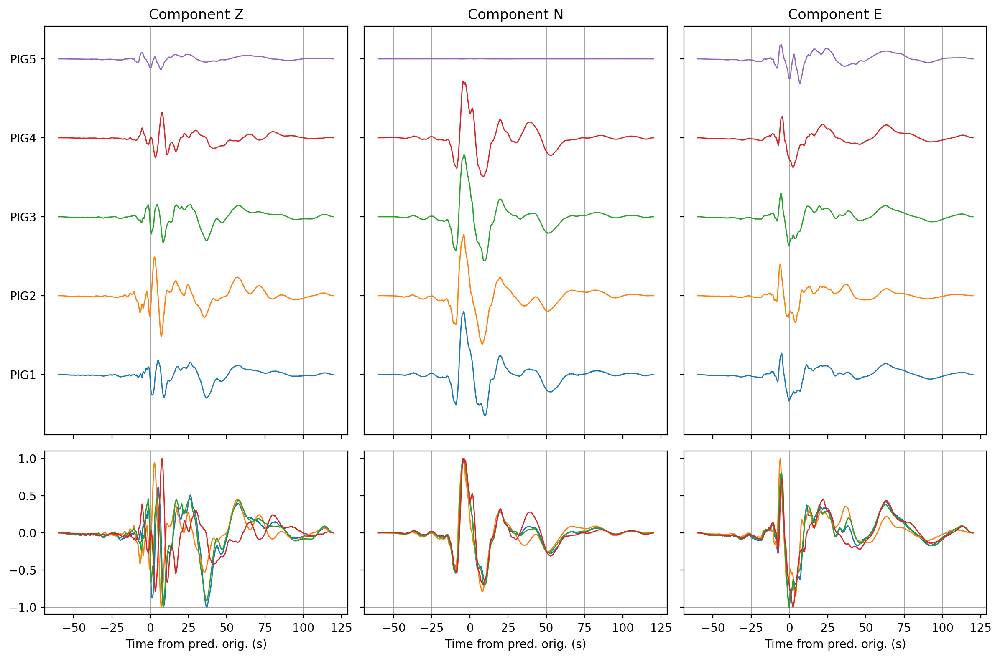

In [11]:
import matplotlib.dates as mdates
from obspy import read

fname = Path('XC_20130522122445.mseed')
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
# st.filter('bandpass', freqmin=.05, freqmax=.25, corners=4, zerophase=True)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])
fig, ax = plt.subplots(2, 3, sharex=True, sharey='row', figsize=(12, 8), gridspec_kw={'height_ratios': [1, 0.4]})

# start_picks = [
#     [-17, -22, -20, -16, -19],
#     [-37, -38, -37, -36, 0],
#     [-31.7, -33, -32, -30.5, -31.5]
# ]

# big_picks = [
#     [5, 2.7, 4.3, 7.6, 3],
#     [-4.2, -5, -4.5, -4.2, 0],
#     [-5.5, -6, -5.5, -5, -5.5]
# ]

for c in range(3):
    ax[0, c].set_title('Component %s' % 'ZNE'[c])
    for s in range(5):
        tr = st.select(component='ZNE'[c], station='PIG%01d' % (s + 1))[0]
        tvec = tr.stats.starttime - evtime + tr.times()
        ax[0, c].plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
        # ax[0, c].plot(start_picks[c][s], s, marker='|', markersize=35, markeredgecolor='k', markerfacecolor='none')
        # ax[0, c].plot(big_picks[c][s], s, marker='|', markersize=85, markeredgecolor='pink', markerfacecolor='none')
        if s < 4: 
            _ = 1 / np.max(np.abs(tr.data))
            ax[1, c].plot(tvec, tr.data*_, label=tr.id, lw=1)
    ax[1, c].set(xlabel='Time from pred. orig. (s)')
    # ax[0, c].set_xlim((-20, 10))
    # ax[1, c].set_xlim((-20, 10))
    ax[0, c].grid(lw=.25, c='gray')
    ax[1, c].grid(lw=.25, c='gray')
ax[0, 0].set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])
# ax[0, 0].set(xlim=(-20, 10))
fig.tight_layout()
plt.show()

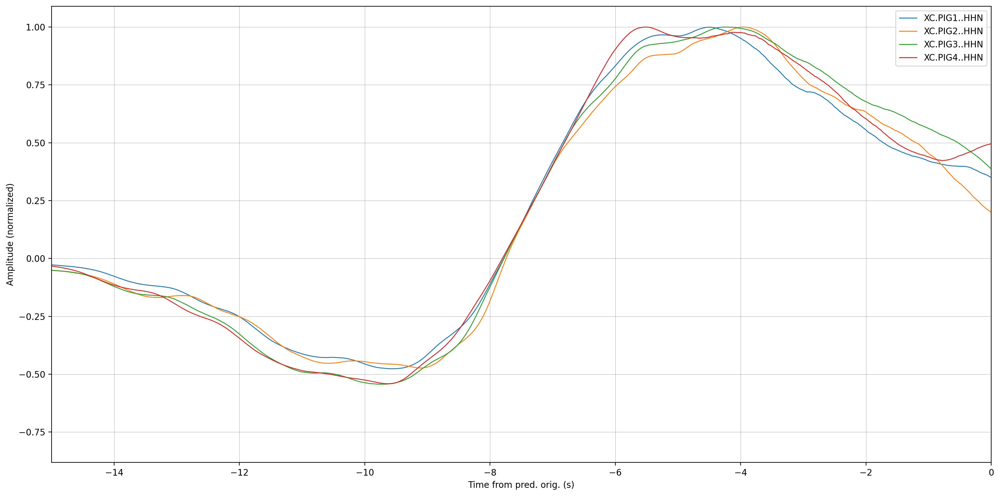

In [12]:
fname = Path('XC_20130522122445.mseed')
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')

fig = plt.figure(figsize=(16, 8))
ax = fig.add_subplot(111)

t_offsets = [-0.5, 0, -0.5, -1.05, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times() + t_offsets[s]

    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax.plot(tvec, tr.data*_, label=tr.id, lw=1)
        
ax.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax.set_xlim((-15, 0))
ax.grid(lw=.25, c='gray')
plt.legend()
fig.tight_layout()
plt.show()
    

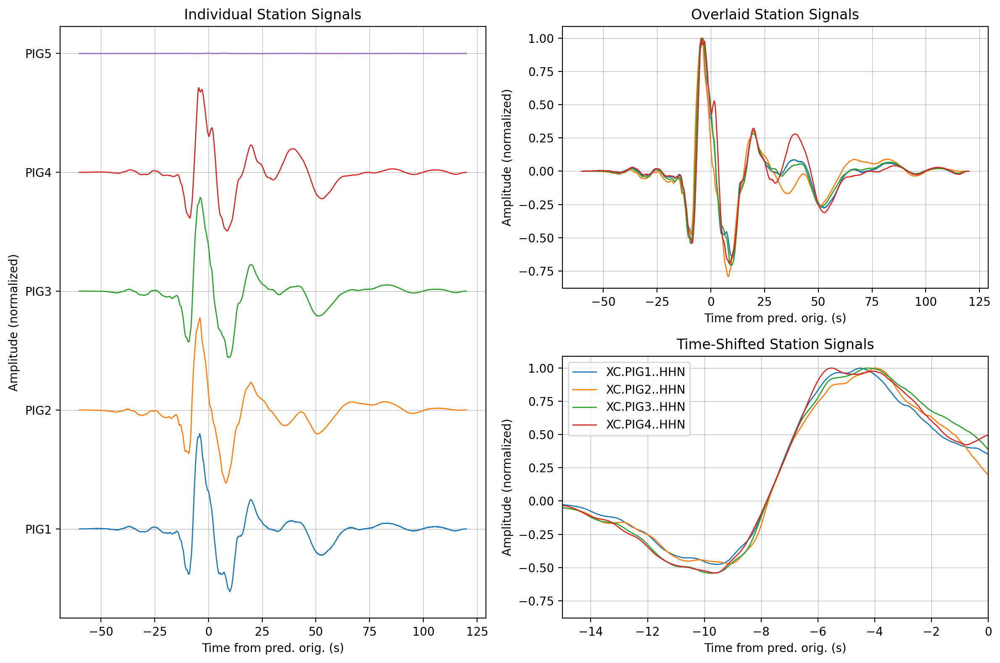

In [13]:
fname = Path('XC_20130522122445.mseed')
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(12, 8))

# Left: one large plot
ax_left = fig.add_subplot(1, 2, 1)

# Right: two stacked plots
gs = fig.add_gridspec(2, 2, width_ratios=[1, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs[0, 1])
ax_right_bottom = fig.add_subplot(gs[1, 1])

t_offsets = [-0.5, 0, -0.5, -1.05, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_bottom.set_xlim((-15, 0))

ax_left.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_left.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left.set_title("Individual Station Signals")
ax_right_top.set_title("Overlaid Station Signals")
ax_right_bottom.set_title("Time-Shifted Station Signals")

plt.legend()
plt.tight_layout()
plt.show()


In [14]:
event_paths = [
"XC_20130522122445.mseed",
"XC_20131121072851.mseed",
"XC_20131123042204.mseed",
"XC_20131119124617.mseed",
"XC_20131115132415.mseed",
"XC_20131110191640.mseed",
"XC_20131109072451.mseed",
"XC_20130621213302.mseed"
]

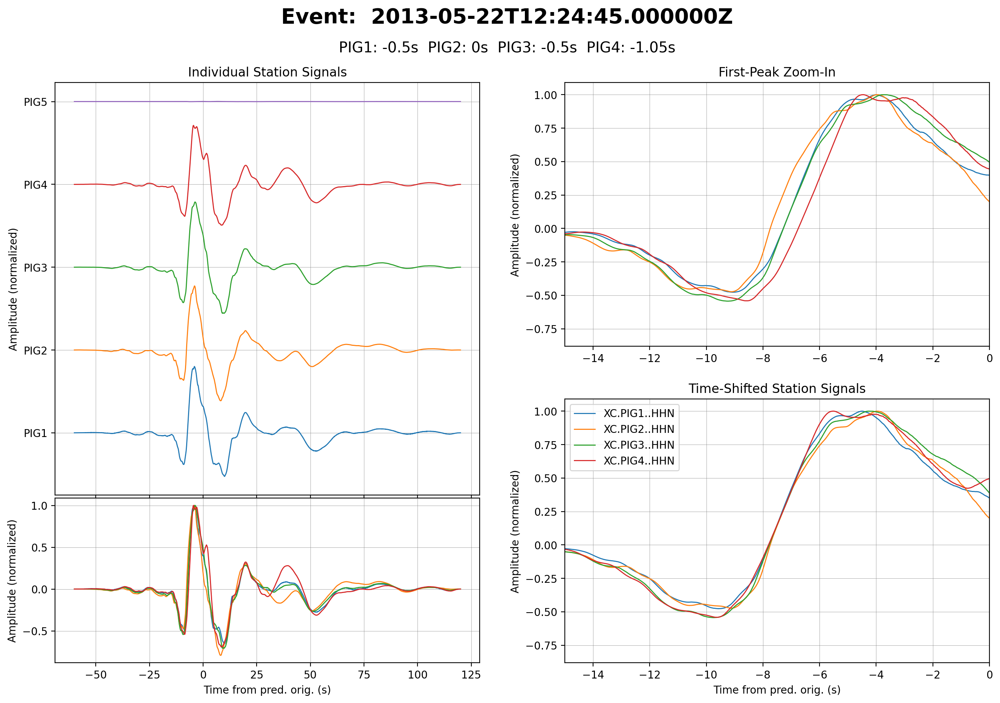

In [15]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.ticker import NullFormatter

fname = Path(event_paths[0])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.5, 0, -0.5, -1.05, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

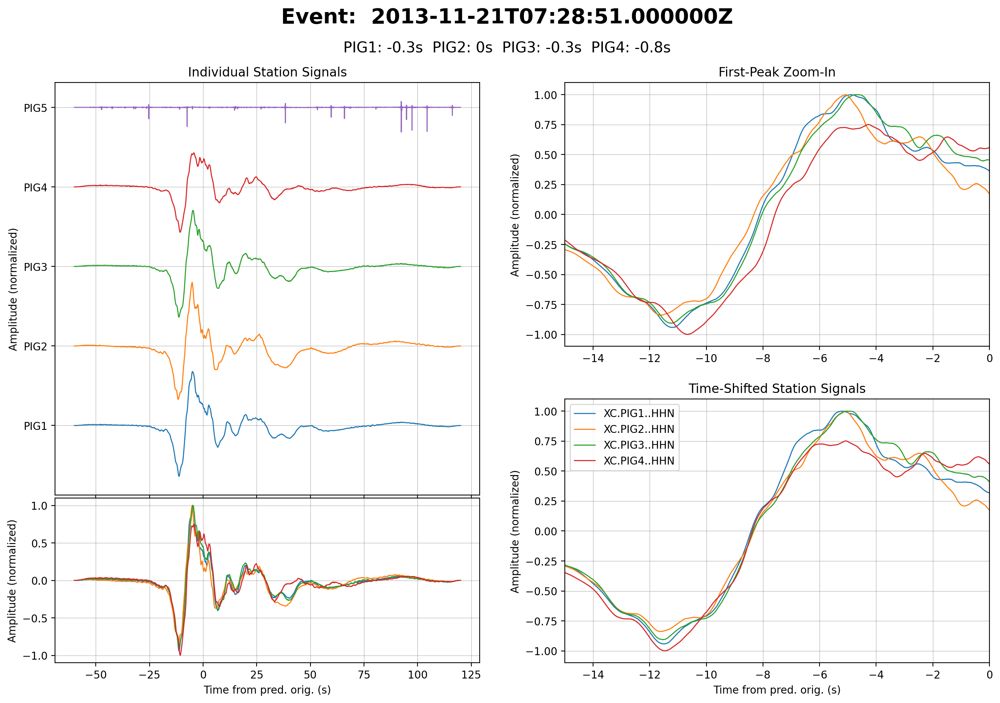

In [16]:
fname = Path(event_paths[1])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.3, 0, -0.3, -0.8, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

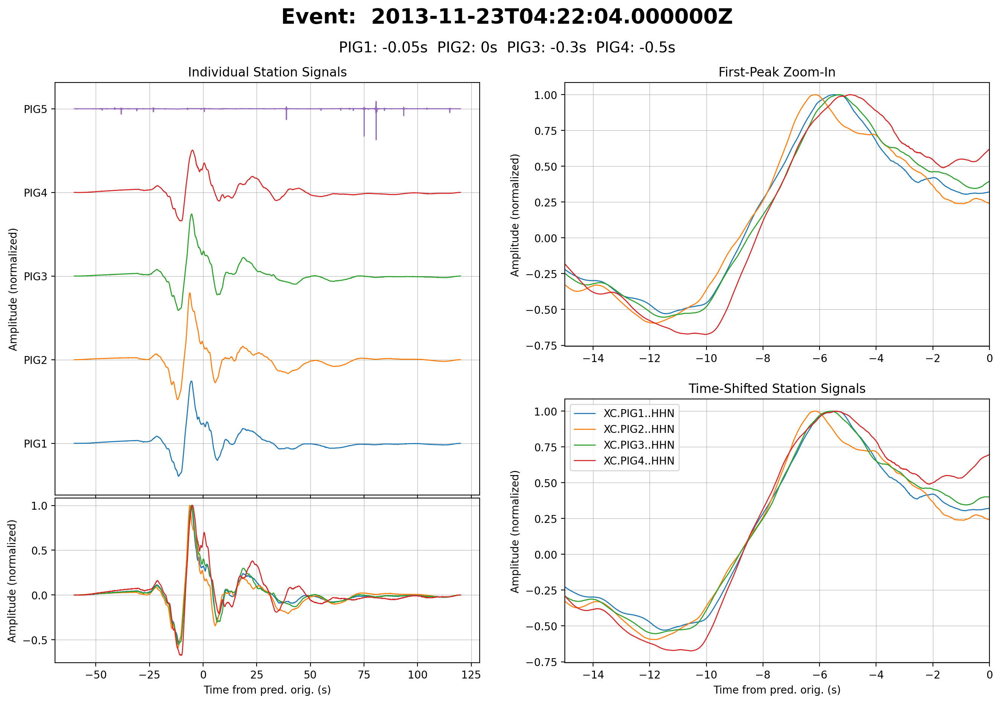

In [17]:
fname = Path(event_paths[2])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.05, 0, -0.3, -0.5, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

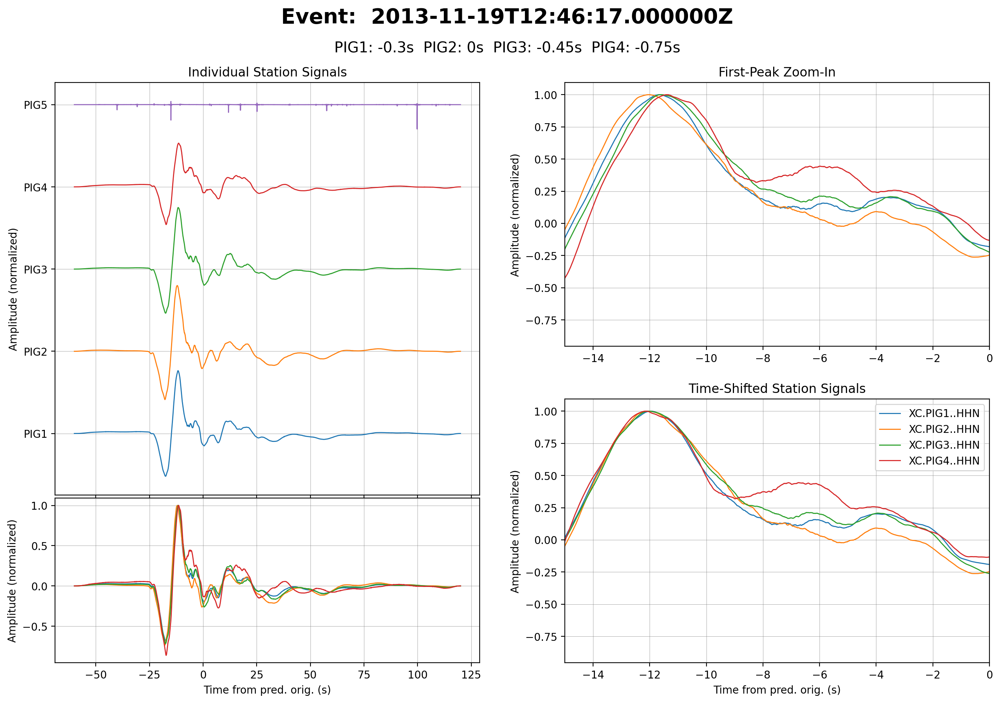

In [18]:
fname = Path(event_paths[3])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.3, 0, -0.45, -0.75, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

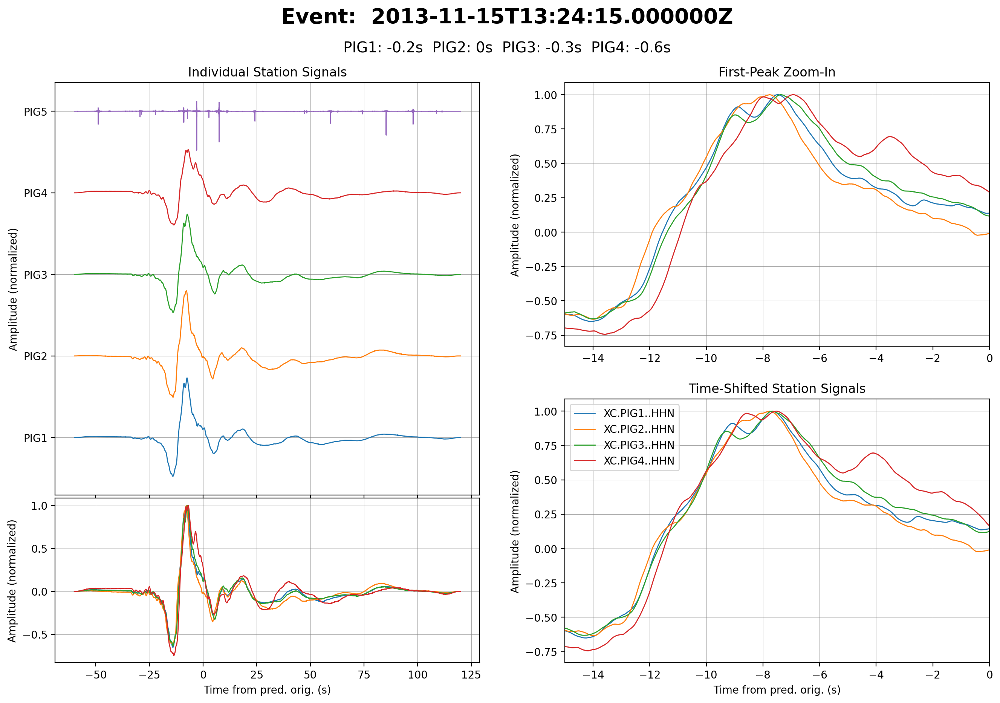

In [19]:
fname = Path(event_paths[4])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.2, 0, -0.3, -0.6, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

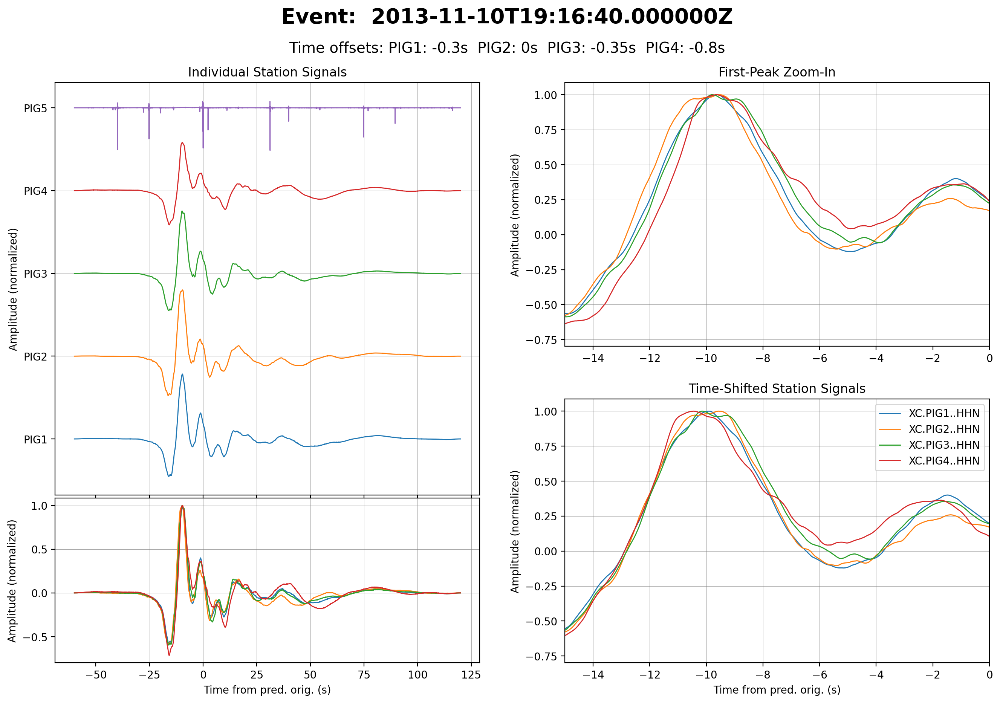

In [51]:
fname = Path(event_paths[5])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.3, 0, -0.35, -0.8, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"Time offsets: PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

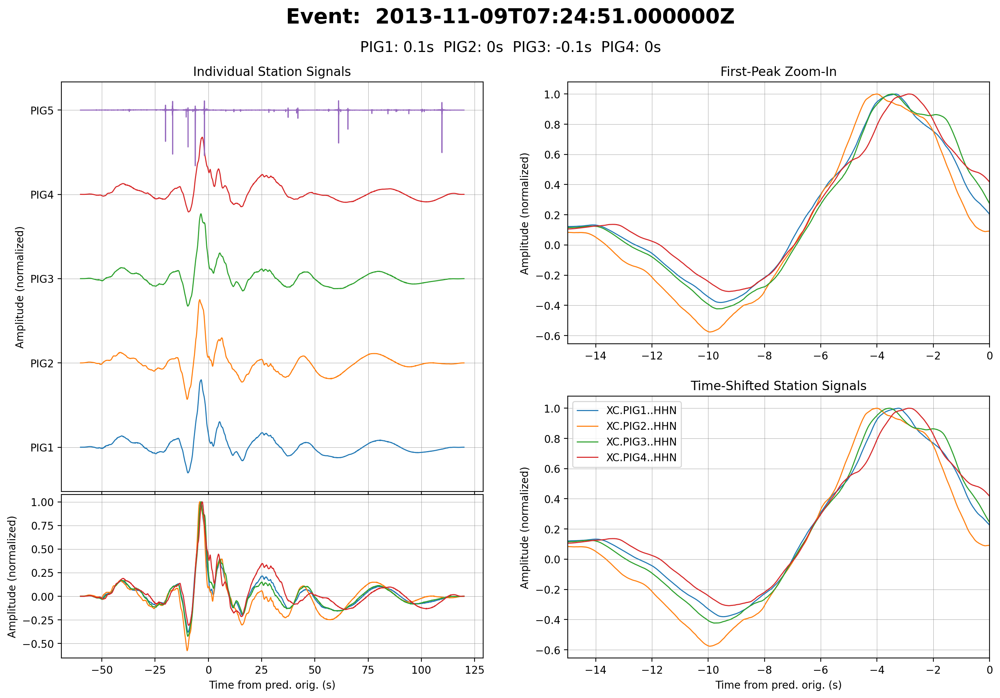

In [21]:
fname = Path(event_paths[6])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [0.1, 0, -0.1, 0, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

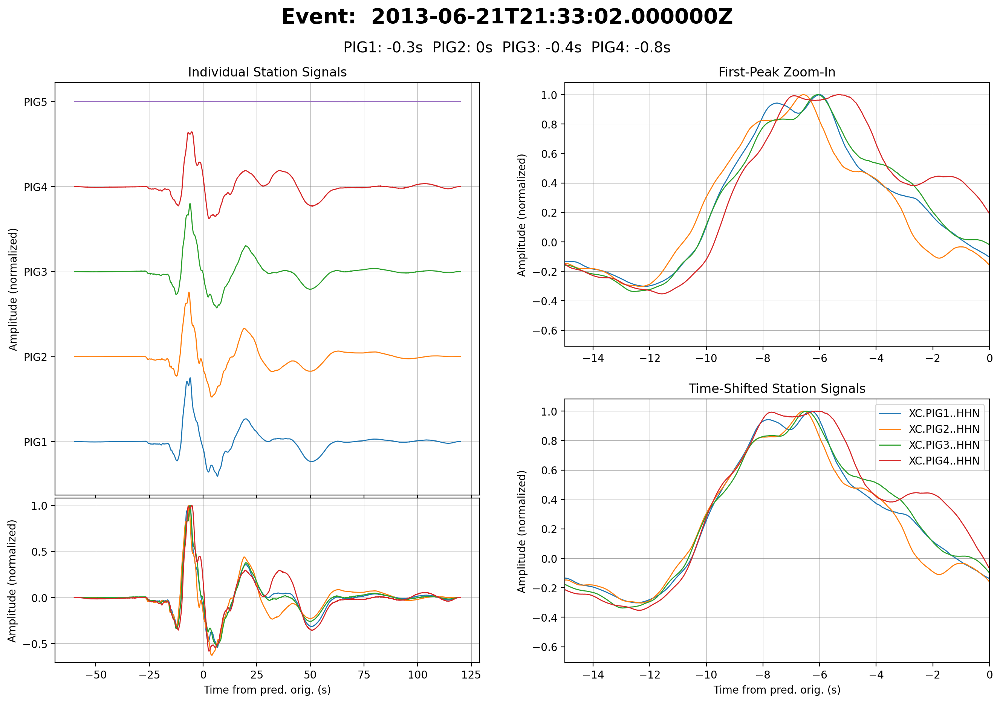

In [22]:
fname = Path(event_paths[7])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.3, 0, -0.4, -0.8, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_bottom.set_xlim((-15, 0))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

In [23]:
len(event_paths)

8

In [24]:
t_offsets_list = [
    [-0.5, 0, -0.5, -1.05, 0],
    [-0.3, 0, -0.3, -0.8, 0],
    [-0.05, 0, -0.3, -0.5, 0],
    [-0.3, 0, -0.45, -0.75, 0],
    [-0.2, 0, -0.3, -0.6, 0],
    [-0.3, 0, -0.35, -0.8, 0],
    [0.1, 0, -0.1, 0, 0],
    [-0.3, 0, -0.4, -0.8, 0]
]

In [25]:
from obspy.geodetics import gps2dist_azimuth

def distance(lat1, lon1, lat2, lon2):
    return gps2dist_azimuth(lat1, lon1, lat2, lon2)[0]/1000

distance_2_to_4 = distance(
    inv.select(network='XC')[0][1].latitude,
    inv.select(network='XC')[0][1].longitude,
    inv.select(network='XC')[0][3].latitude,
    inv.select(network='XC')[0][3].longitude
)

tdiff_start_1 = t_offsets_list[0][3] - t_offsets_list[0][1]
tdiff_start_2 = t_offsets_list[1][3] - t_offsets_list[1][1]
tdiff_start_3 = t_offsets_list[2][3] - t_offsets_list[2][1]
tdiff_start_4 = t_offsets_list[3][3] - t_offsets_list[3][1]
tdiff_start_5 = t_offsets_list[4][3] - t_offsets_list[4][1]
tdiff_start_6 = t_offsets_list[5][3] - t_offsets_list[5][1]
tdiff_start_7 = t_offsets_list[6][3] - t_offsets_list[6][1]
tdiff_start_8 = t_offsets_list[7][3] - t_offsets_list[7][1]

tdiffs = [tdiff_start_1, tdiff_start_2, tdiff_start_3, tdiff_start_4, tdiff_start_5, tdiff_start_6, tdiff_start_7, tdiff_start_8]

import statistics

wavespeed_estimates = []

for i in range(len(tdiffs)):
    wavespeed_estimate = distance_2_to_4 / tdiffs[i] if tdiffs[i] != 0 else 0
    wavespeed_estimates.append(wavespeed_estimate)

wavespeed_mean = sum(wavespeed_estimates) / len(wavespeed_estimates)
wavespeed_std = statistics.stdev(wavespeed_estimates)

print(f'wavespeed estimates: {[f"{x:.2f}" for x in wavespeed_estimates]} km/s')
print(f'wavespeed mean: {wavespeed_mean:.2f} km/s')
print(f'wavespeed standard deviation: {wavespeed_std:.2f} km/s \n')
print(f'wavespeed : {wavespeed_mean - wavespeed_std:.2f} km/s to {wavespeed_mean + wavespeed_std:.2f} km/s')

wavespeed estimates: ['-2.01', '-2.64', '-4.22', '-2.81', '-3.51', '-2.64', '0.00', '-2.64'] km/s
wavespeed mean: -2.56 km/s
wavespeed standard deviation: 1.23 km/s 

wavespeed : -3.79 km/s to -1.33 km/s


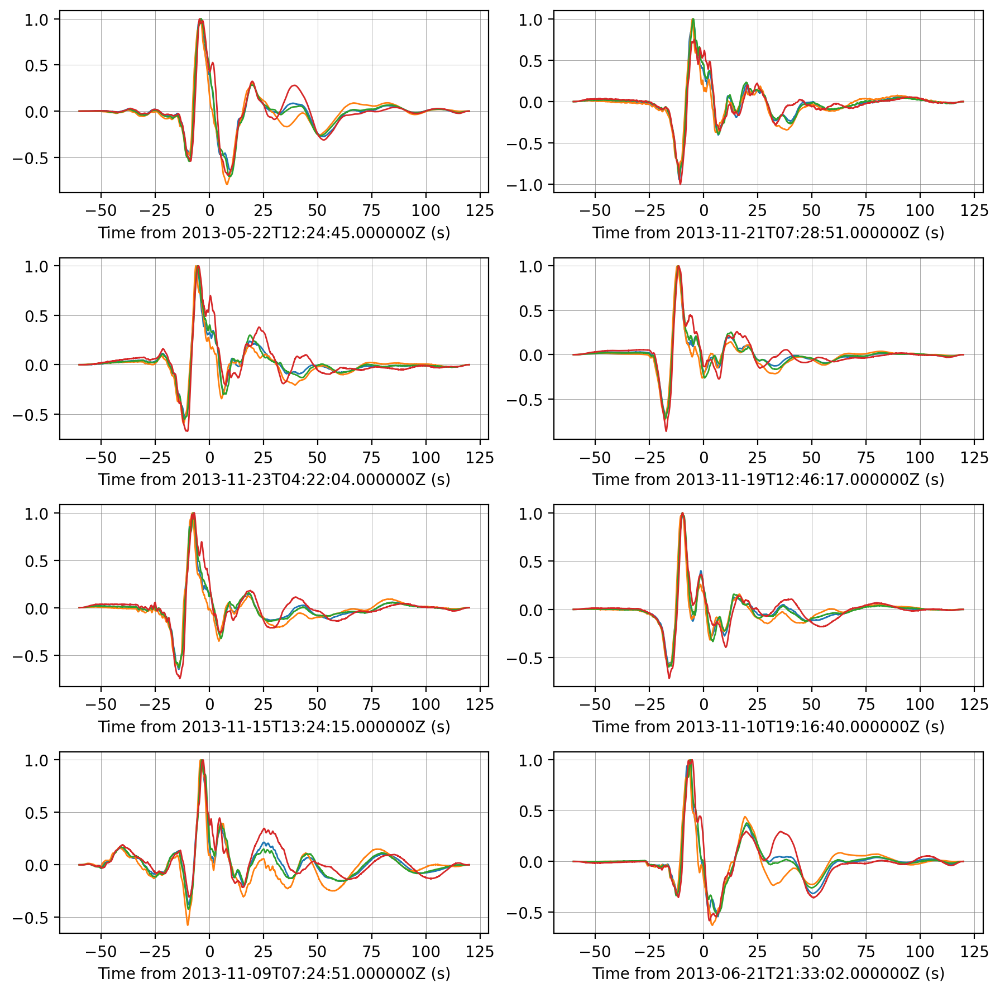

In [26]:
fig = plt.figure(figsize=(9, 9)) # all about -10s from the relocated origin time
axes = []

sts, evtimes = [], []

for i in range(len(event_paths)):
    fname = Path(event_paths[i])
    evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
    evtimes.append(evtime)
    st = read(fname)
    st.taper(max_percentage=0.05, type='cosine')
    sts.append(st)
    ax = plt.subplot(4, 2, i+1)
    axes.append(ax)
    
    for s in range(5):
        tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
        tvec = tr.stats.starttime - evtime + tr.times()
        if s < 4:
            _ = 1 / np.max(np.abs(tr.data))
            ax.plot(tvec, tr.data*_, label=tr.id, lw=1)
    ax.set(xlabel= f'Time from {evtime} (s)')
    ax.grid(lw=.25, c='gray')

fig.tight_layout()
plt.show()

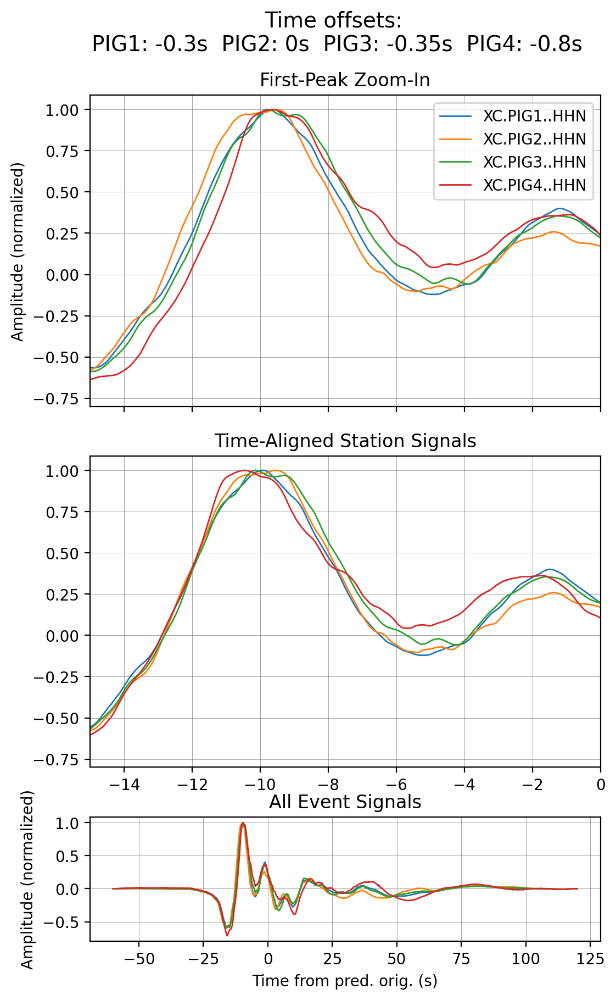

In [65]:
fname = Path(event_paths[5])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(6, 10))
gs = gridspec.GridSpec(3, 1, height_ratios=[1, 1, 0.4], hspace=0.2)

ax_right_top = fig.add_subplot(gs[0])
ax_right_mid = fig.add_subplot(gs[1])
ax_right_bottom = fig.add_subplot(gs[2])

t_offsets = [-0.3, 0, -0.35, -0.8, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_right_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_mid.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-15, 0))
ax_right_mid.set_xlim((-15, 0))

ax_right_top.xaxis.set_major_formatter(NullFormatter())


ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')

ax_right_mid.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_mid.set_title("Time-Aligned Station Signals")
ax_right_bottom.set_title("All Event Signals")

fig.text(0.5, 0.92, f"Time offsets: \nPIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

ax_right_top.legend()

#plt.tight_layout()

fig.savefig('ExtraHFInfoSeptember2025.svg')

plt.show()

In [27]:
st_N = st.select(component='N').copy()
for tr in st_N:
    tr.data = tr.data[:18000]

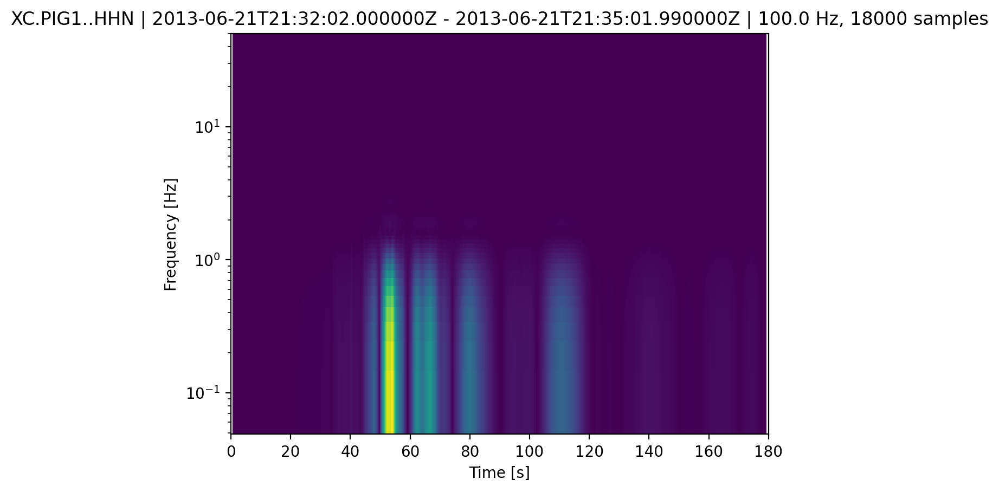

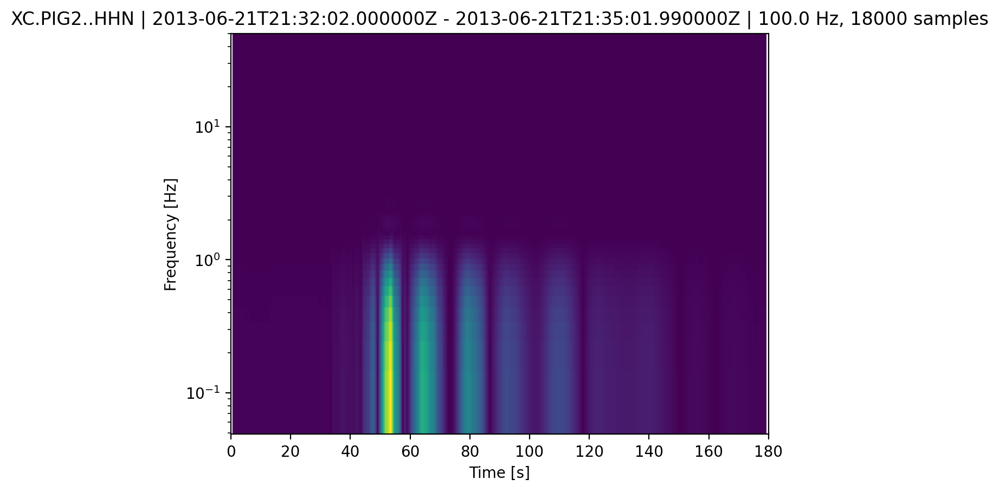

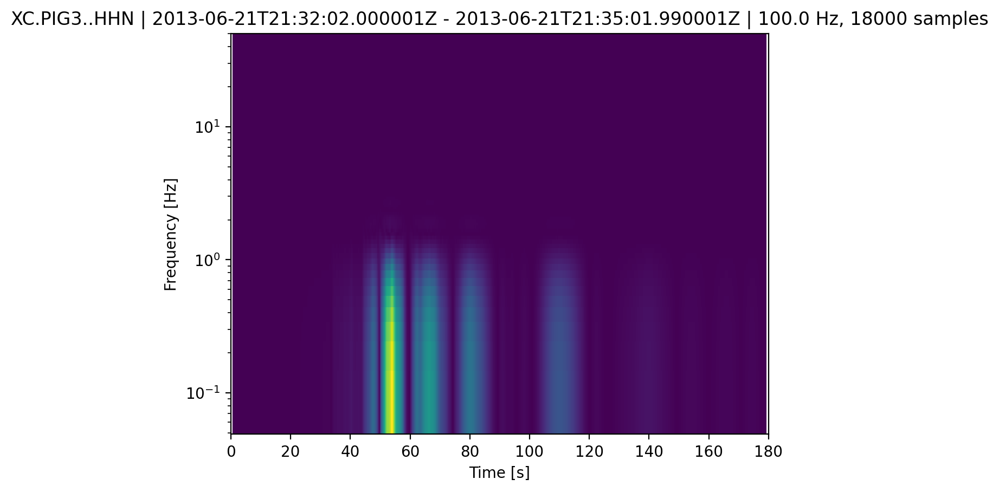

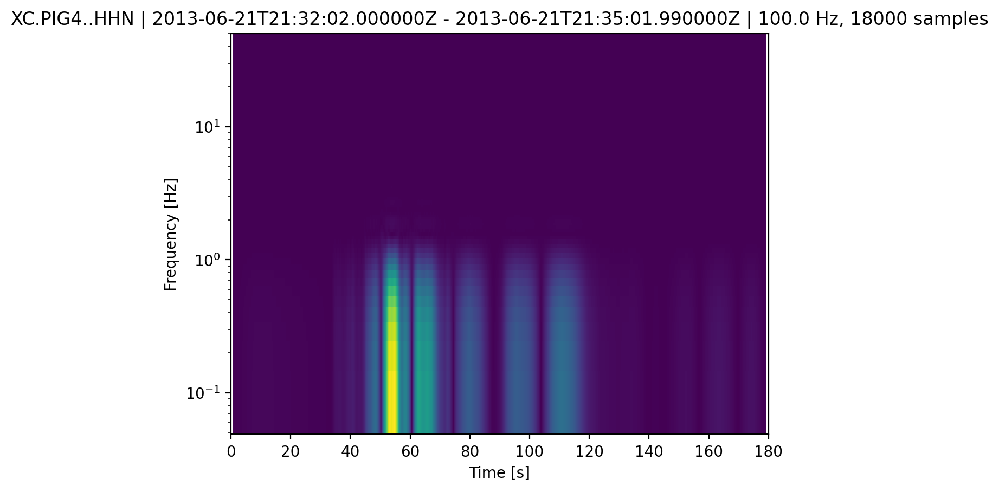

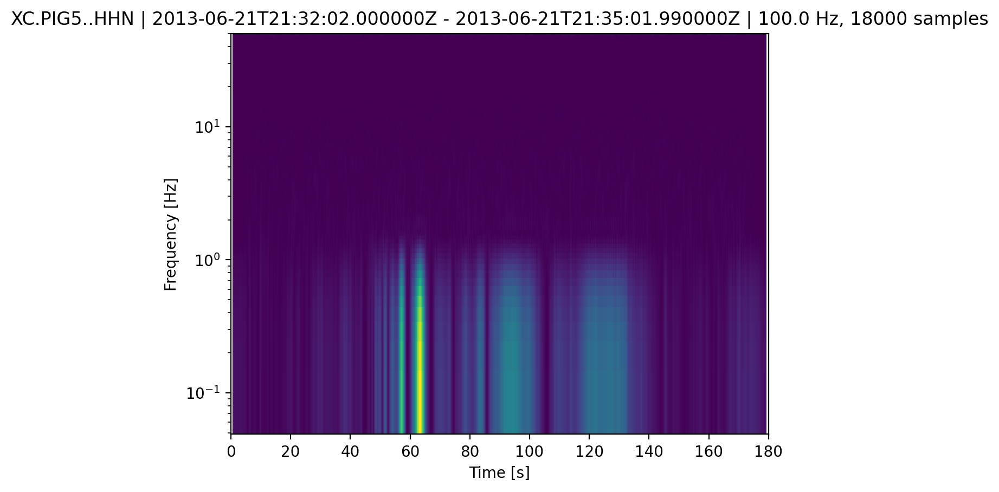

In [28]:
for tr in st_N:
    tr.spectrogram(log=True)

In [29]:
tom = [1]

np.mean(tom)

np.float64(1.0)

In [30]:
import math
from matplotlib import mlab
from matplotlib.colors import Normalize
from matplotlib.ticker import NullFormatter
from scipy.signal import hilbert

def plot_fancy_normy(traces, name=None, savefig=False, left=0.1, bottom=0.1, h_1=0.2, h_2=0.6, w_1=0.2, w_2=0.6):
    '''
    plot of spectrogram, signal, and FFT, with normalised and unnormalised averages in place
    '''
    ## spectrogram bit
    fs = 100.0  # sampling rate in Hz
    nfft = 256  # number of points in FFT
    pad_to = 1024  # padding to next power of 2
    noverlap = 128  # number of points to overlap between segments
    vmin, vmax = 0.0, 1.0  # color scale limits

    # extracting the data
    datas = []
    datas_times = []
    for trace in traces:
        if len(trace.data) > 8000:  # somewhat arbitrary - we expect 400 and can't use 128 or below lengths
            datas.append(trace.data)
            datas_times.append(trace.times())

    datas_max = max([max(data) for data in datas])
    datas_min = min([min(data) for data in datas])

    # Hilbert envelopes
    envelopes = []
    envelopes_max = []
    envelopes_norm = []
    for i in range(len(datas)):
        analytic_signal = hilbert(datas[i])
        envelope = np.abs(analytic_signal)
        envelopes_max.append(np.max(envelope))
        envelope_norm = envelope / np.max(envelope)  # normalising the envelope
        envelopes.append(envelope)
        envelopes_norm.append(envelope_norm)

    # average signal
    average_signal = np.mean(envelopes, axis=0)
    average_signal_norm = np.mean(envelopes_norm, axis=0) * np.max(envelopes_max)

    # doing the spectrogram calculation
    if len(datas) == 0:
        return None  # no data to process
    else:
        specs, freqs, times = [], [], []
        for data in datas:
            spec, freq, time = mlab.specgram(data, Fs=fs, NFFT=nfft, pad_to=pad_to, noverlap=noverlap)
            spec = np.sqrt(spec[1:, :])
            freq = freq[1:]
            halfbin_time = (time[1] - time[0]) / 2.0
            halfbin_freq = (freq[1] - freq[0]) / 2.0
            freq = np.concatenate((freq, [freq[-1] + 2 * halfbin_freq]))
            time = np.concatenate((time, [time[-1] + 2 * halfbin_time]))
            time -= halfbin_time
            freq -= halfbin_freq
            specs.append(spec)
            freqs.append(freq)
            times.append(time)

        # making them all of equal size
        min_time_bins = min(spec.shape[1] for spec in specs)
        min_freq_bins = min(spec.shape[0] for spec in specs)
        for i in range(len(specs)):
            specs[i] = specs[i][:min_freq_bins, :min_time_bins]
            vmin = specs[i].min() + vmin * float(specs[i].max() - specs[i].min())
            vmax = specs[i].min() + vmax * float(specs[i].max() - specs[i].min())
            specs[i] = (specs[i] - specs[i].min()) / (specs[i].max() - specs[i].min())  # normalize

        avg_spec = np.mean(specs, axis=0)
        spectrogram_data = times[0][:min_time_bins], freqs[0][:min_freq_bins], avg_spec

    ## FFT bit
    spectrums = []
    ns = []
    fft_datas = []
    fft_datas_norm = []
    fft_max = []
    for i in range(len(datas)):
        fft = np.fft.fft(datas[i])
        fft_max.append(np.max(np.abs(fft)))
        fft_norm = fft / np.max(np.abs(fft))  # normalize
        fft_datas.append(fft)
        fft_datas_norm.append(fft_norm)
        nn = len(datas[i])
        ns.append(nn)
        spectrums.append(np.fft.fftfreq(nn, 1))

    fft_average = np.mean(np.abs(fft_datas), axis=0)
    fft_average_norm = np.mean(np.abs(fft_datas_norm), axis=0) * np.max(fft_max)

    ## plotting
    fig = plt.figure(figsize=(7, 7))

    # plot signals
    ax_sig = fig.add_axes([left + w_1, bottom, w_2, h_1])
    for i in range(len(datas)):
        ax_sig.plot(datas_times[i], datas[i], color='grey')
    ax_sig.plot(datas_times[0], average_signal, color='C0', linewidth=2, label='avg signal')
    ax_sig.plot(datas_times[0], average_signal_norm, color='C1', linewidth=2, label='avg norm signal')
    ax_sig.plot(datas_times[0][np.argmax(average_signal)], np.max(average_signal), 'or')
    ax_sig.plot(datas_times[0][np.argmax(average_signal_norm)], np.max(average_signal_norm), 'or')
    ax_sig.axvline(60, 0, 1, color='k', linewidth=2, alpha=0.7)

    # plot spectrogram
    ax_spec = fig.add_axes([left + w_1, bottom + h_1, w_2, h_2])
    x, y, data = spectrogram_data
    ax_spec.set_yscale('log')
    img_spec = ax_spec.pcolormesh(x, y, data, shading='gouraud')
    img_spec.set_rasterized(True)
    ax_spec.axvline(60, 0, 1, color='k', alpha=0.7, linewidth=2, label='expected arrival')
    # ax_spec.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2, label='expected freq.')
    # ax_spec.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

    # plot fft
    ax_fft = fig.add_axes([left, bottom + h_1, w_1, h_2])
    for i in range(len(spectrums)):
        ax_fft.semilogy(np.abs(fft_datas[i][:ns[i] // 2]), spectrums[i][:ns[i] // 2], color='grey')
    ax_fft.semilogy(np.abs(fft_average[:ns[0] // 2]), spectrums[0][:ns[0] // 2], color='C0', linewidth=2, label='average')
    ax_fft.semilogy(np.abs(fft_average_norm[:ns[0] // 2]), spectrums[0][:ns[0] // 2], color='C1', linewidth=2, label='norm. average\n(scaled)')
    ax_fft.plot(np.max(fft_average), spectrums[0][np.argmax(fft_average[:ns[0] // 2])], 'or')
    ax_fft.plot(np.max(fft_average_norm), spectrums[0][np.argmax(fft_average_norm[:ns[0] // 2])], 'or')
    # ax_fft.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)
    # ax_fft.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

    #ax_fft.yaxis.set_major_locator(LogLocator(base=10.0, subs=np.arange(1.0, 20.0) * 0.1, numticks=15))
    
    # ax_spec.set_ylim(0.009, 10)
    ax_spec.set_xlim(x[0], x[-1])
    ax_sig.set_ylim(datas_min * 1.1, datas_max * 1.1)
    ax_sig.set_xlim(x[0], x[-1])
    # ax_fft.set_ylim(0.009, 10)
    ax_fft.invert_xaxis()

    ax_sig.set_xlabel('time (s)')
    ax_fft.set_ylabel('frequency (Hz)')

    # remove axis labels
    ax_spec.xaxis.set_major_formatter(NullFormatter())
    ax_spec.yaxis.set_major_formatter(NullFormatter())
    ax_fft.xaxis.set_major_formatter(NullFormatter())

    # plot titling
    plot_title = namestr(traces, globals())
    if name is not None:
        plt.suptitle(f'{name}', fontsize=16, fontweight='bold')
    elif plot_title:
        plt.suptitle(f'{plot_title[0]} - Spectrogram, Signal and FFT', fontsize=16, fontweight='bold')    
    else:
        plt.suptitle('Spectrogram, Signal and FFT', fontsize=16, fontweight='bold')


    plt.legend(bbox_to_anchor=(0.85, -0.1, 0.02, 0.01))
    
    if savefig is True:
        plt.savefig(f'{name}.png', bbox_inches='tight', dpi=300)

    #plt.suptitle(f'{plot_title[0]} - Spectrogram, Signal and FFT', fontsize=16, fontweight='bold')
    plt.show()
    return plot_title

In [31]:
def single_spectrogram(trace, name=None, savefig=False, left=0.1, bottom=0.1, h_1=0.2, h_2=0.6, w_1=0.2, w_2=0.6):
    fs = 100.0  # sampling rate in Hz
    nfft = 256  # number of points in FFT
    pad_to = 1024  # padding to next power of 2
    noverlap = 128  # number of points to overlap between segments
    vmin, vmax = 0.0, 1.0  # color scale limits
    
    if len(trace.data) < 2000:
        return None
    
    data_max = max(trace.data)
    data_min = min(trace.data)
    
    # Hilbert envelopes
    analytic_signal = hilbert(trace.data)
    envelope = np.abs(analytic_signal)
    envelope_max = np.max(envelope)
    
    # spectrogram
    spec, freq, time = mlab.specgram(trace.data, Fs=fs, NFFT=nfft, pad_to=pad_to, noverlap=noverlap)
    spec = np.sqrt(spec[1:, :])
    freq = freq[1:]
    halfbin_time = (time[1] - time[0]) / 2.0
    halfbin_freq = (freq[1] - freq[0]) / 2.0
    freq = np.concatenate((freq, [freq[-1] + 2 * halfbin_freq]))
    time = np.concatenate((time, [time[-1] + 2 * halfbin_time]))
    time -= halfbin_time
    freq -= halfbin_freq
    # normalising the spectrogram
    vmin = spec.min() + vmin * float(spec.max() - spec.min())
    vmax = spec.min() + vmax * float(spec.max() - spec.min())
    spec_normed = (spec - spec.min()) / (spec.max() - spec.min())  # normalize
    #norm = Normalize(vmin, vmax, clip=True)
    min_time_bin = spec.shape[1]
    min_freq_bin = spec.shape[0]
    spectrogram_data = time, freq, spec_normed
    
    # FFT
    fft = np.fft.fft(trace.data)
    fft_max = np.max(np.abs(fft))
    fft_norm = fft / fft_max if fft_max != 0 else fft
    nn = len(trace.data)
    spectrums = np.fft.fftfreq(nn, 1)

    # plotting
    fig = plt.figure(figsize=(7, 7))

    # plot signals
    ax_sig = fig.add_axes([left + w_1, bottom, w_2, h_1])
    ax_sig.plot(trace.times(), trace.data, color='grey')
    #ax_sig.plot(trace.times[np.argmax(trace.data)], np.max(trace.data), 'or')
    ax_sig.axvline(60, 0, 1, color='k', linewidth=2, alpha=0.7)

    # plot spectrogram
    ax_spec = fig.add_axes([left + w_1, bottom + h_1, w_2, h_2])
    x, y, data = spectrogram_data
    ax_spec.set_yscale('log')
    img_spec = ax_spec.pcolormesh(x, y, data, shading='gouraud')
    img_spec.set_rasterized(True)
    ax_spec.axvline(60, 0, 1, color='k', alpha=0.7, linewidth=2, label='expected arrival')
    ax_spec.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2, label='expected freq.')
    ax_spec.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

    # plot fft
    ax_fft = fig.add_axes([left, bottom + h_1, w_1, h_2])
    ax_fft.semilogy(np.abs(fft[:nn // 2]), spectrums[:nn // 2], color='grey')
    #ax_fft.plot(np.max(fft), spectrums[np.argmax(fft[:nn // 2])], 'or')
    ax_fft.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)
    ax_fft.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

    #ax_fft.yaxis.set_major_locator(LogLocator(base=10.0, subs=np.arange(1.0, 20.0) * 0.1, numticks=15))
    
    ax_spec.set_ylim(0.009, 10)
    #ax_spec.set_xlim(x[0], x[-1])
    ax_sig.set_ylim(min(trace.data), max(trace.data))
    #ax_sig.set_xlim(x[0], x[-1])
    ax_fft.set_ylim(0.009, 10)
    ax_fft.invert_xaxis()

    ax_sig.set_xlabel('time (s)')
    ax_fft.set_ylabel('frequency (Hz)')

    # remove axis labels
    ax_spec.xaxis.set_major_formatter(NullFormatter())
    ax_spec.yaxis.set_major_formatter(NullFormatter())
    ax_fft.xaxis.set_major_formatter(NullFormatter())

    # plot titling
    plot_title = namestr(trace, globals())
    if name is not None:
        plt.suptitle(f'{name}', fontsize=16, fontweight='bold')
    elif plot_title:
        plt.suptitle(f'{plot_title[0]} - Spectrogram, Signal and FFT', fontsize=16, fontweight='bold')    
    else:
        plt.suptitle('Spectrogram, Signal and FFT', fontsize=16, fontweight='bold')


    #plt.legend(bbox_to_anchor=(0.85, -0.1, 0.02, 0.01))
    
    if savefig is True:
        plt.savefig(f'{name}.png', bbox_inches='tight', dpi=300)

    #plt.suptitle(f'{plot_title[0]} - Spectrogram, Signal and FFT', fontsize=16, fontweight='bold')
    plt.show()
    return plot_title




    #data_gouraud = np.pad(spec, ((0, len(freq) - spec.shape[0]), (0, len(time) - spec.shape[1])), mode='edge')
    
    #return time, freq, data_gouraud, norm





In [32]:
# new_trace

In [33]:
# plotte = single_spectrogram(new_trace)

In [34]:
def single_spectrogramy(trace):
    fs = 1.0 # sampling rate in Hz
    nfft = 128  # number of points in FFT
    pad_to = 1024  # padding to next power of 2
    noverlap = 115 # number of points to overlap between segments
    vmin, vmax = 0.0, 1.0  # color scale limits
    
    if len(trace.data) < 300:
        return None
    
    spec, freq, time = mlab.specgram(trace.data, Fs=fs, NFFT=nfft, pad_to=pad_to, noverlap=noverlap)
    spec = np.sqrt(spec[1:, :])
    freq = freq[1:]
    halfbin_time = (time[1] - time[0]) / 2.0
    halfbin_freq = (freq[1] - freq[0]) / 2.0
    freq = np.concatenate((freq, [freq[-1] + 2 * halfbin_freq]))
    time = np.concatenate((time, [time[-1] + 2 * halfbin_time]))
    time -= halfbin_time
    freq -= halfbin_freq
    # normalising the spectrogram
    vmin = spec.min() + vmin * float(spec.max() - spec.min())
    vmax = spec.min() + vmax * float(spec.max() - spec.min())
    norm = Normalize(vmin, vmax, clip=True)
    
    data_gouraud = np.pad(spec, ((0, len(freq) - spec.shape[0]), (0, len(time) - spec.shape[1])), mode='edge')
    
    return time, freq, data_gouraud, norm

NameError: name 'new_trace' is not defined

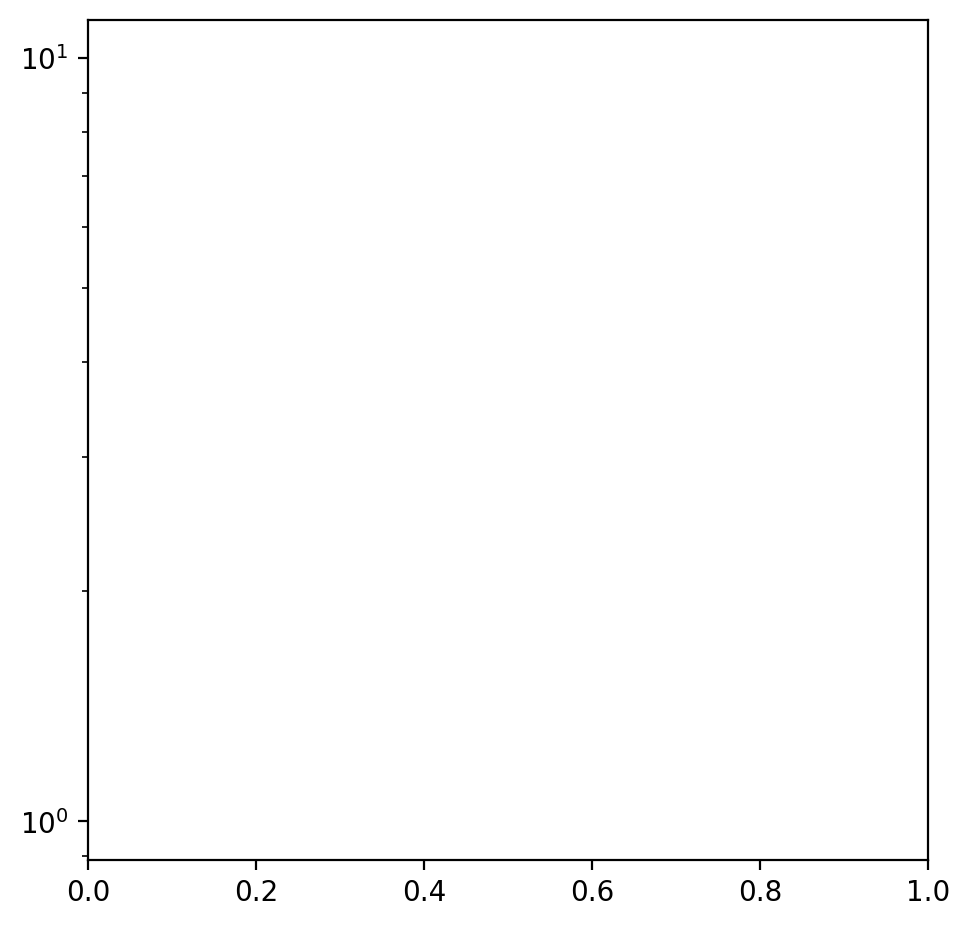

In [35]:
fig = plt.figure(figsize=(7, 7))
ax = fig.add_axes([0.3, 0.3, 0.6, 0.6])
ax.set_yscale('log')
spec_data = single_spectrogramy(new_trace)
if spec_data is not None:
    x, y, data, norm = spec_data
    ax.pcolormesh(x, y, data, norm=norm, shading='gouraud')
    ax.axvline(1272, 0, 1, color='k', alpha=0.7, linewidth=2, label='expected arrival')
    ax.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2, label='expected freq.')
    ax.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

fft_newtrace = np.fft.fft(new_trace.data)
n_newtrace = len(new_trace.data)
spectrum_newtrace = np.fft.fftfreq(n_newtrace, 1)

ax_fft = fig.add_axes([0.1, 0.3, 0.2, 0.6])
ax_fft.semilogy(-np.abs(fft_newtrace[:n_newtrace // 2]), spectrum_newtrace[:n_newtrace // 2], color='grey')
ax_fft.axhline(0.04, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)
ax_fft.axhline(0.06, 0, 1, color='skyblue', alpha=0.5, ls='--', linewidth=2)

ax_sig = fig.add_axes([0.3, 0.1, 0.6, 0.2])
ax_sig.plot(new_trace.times(), new_trace.data, color='grey')
ax_sig.axvline(60, 0, 1, color='k', linewidth=2, alpha=0.7)

ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
ax_fft.xaxis.set_major_formatter(NullFormatter())

ax_sig.set_xlabel('time (s)')
ax_fft.set_ylabel('frequency (Hz)')

plt.show()

In [36]:
def plot_event(event_num, save_fig=False):
    n_events = len(t_events[event_num])
    plot_scaling_factor = 3*(n_events/5) + 1
    plot_numbering = n_events//5 if n_events % 5 == 0 else n_events//5 + 1
    
    fig = plt.figure(figsize=(16,plot_scaling_factor))
    axes = []
    for i in range(len(t_events[event_num])):
        ax = plt.subplot(plot_numbering, 5, i+1)
        axes.append(ax)
        ax.set_yscale('log')        
        
        spec_data = single_spectrogram(t_events[event_num][i])
        if spec_data is None:
            continue
        else:
            x, y, data, norm = spec_data
            ax.pcolormesh(x, y, data, norm=norm, shading='gouraud')
            ax.text(0.52, 0.95, f'Station {t_stations[event_num][i]}', fontsize=8, c='ivory', transform=ax.transAxes)
            ax.text(0.52, 0.90, f'Station {t_events[event_num][i].stats.station}', fontsize=8, c='ivory', transform=ax.transAxes)
            plt.axvline(200, 0, 1, color='k', linewidth=2)
            plt.axhline(0.04, 0, 1, color='ivory', alpha=0.5, ls='--', linewidth=2)
            plt.axhline(0.06, 0, 1, color='ivory', alpha=0.5, ls='--', linewidth=2)
    
    plt.suptitle(f'Thwaites event {event_num + 1} (10-100s)', fontsize=20, fontweight='bold')
    plt.tight_layout(pad=2, rect=[0, 0, 1, 0.99])
    plt.show()

In [37]:
def namestr(obj, namespace):
    return [name for name in namespace if namespace[name] is obj]

In [38]:
st_N

5 Trace(s) in Stream:
XC.PIG1..HHN | 2013-06-21T21:32:02.000000Z - 2013-06-21T21:35:01.990000Z | 100.0 Hz, 18000 samples
XC.PIG2..HHN | 2013-06-21T21:32:02.000000Z - 2013-06-21T21:35:01.990000Z | 100.0 Hz, 18000 samples
XC.PIG3..HHN | 2013-06-21T21:32:02.000001Z - 2013-06-21T21:35:01.990001Z | 100.0 Hz, 18000 samples
XC.PIG4..HHN | 2013-06-21T21:32:02.000000Z - 2013-06-21T21:35:01.990000Z | 100.0 Hz, 18000 samples
XC.PIG5..HHN | 2013-06-21T21:32:02.000000Z - 2013-06-21T21:35:01.990000Z | 100.0 Hz, 18000 samples

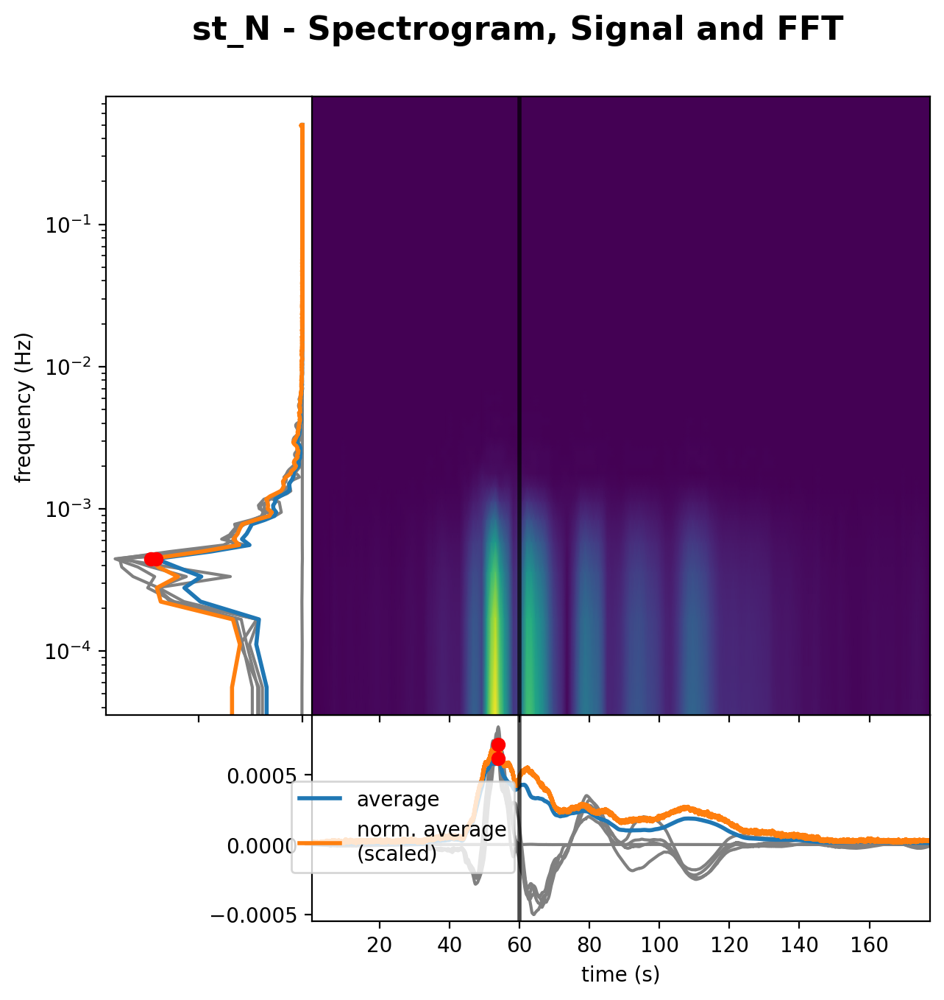

['st_N', '_38']

In [39]:
plot_fancy_normy(st_N)

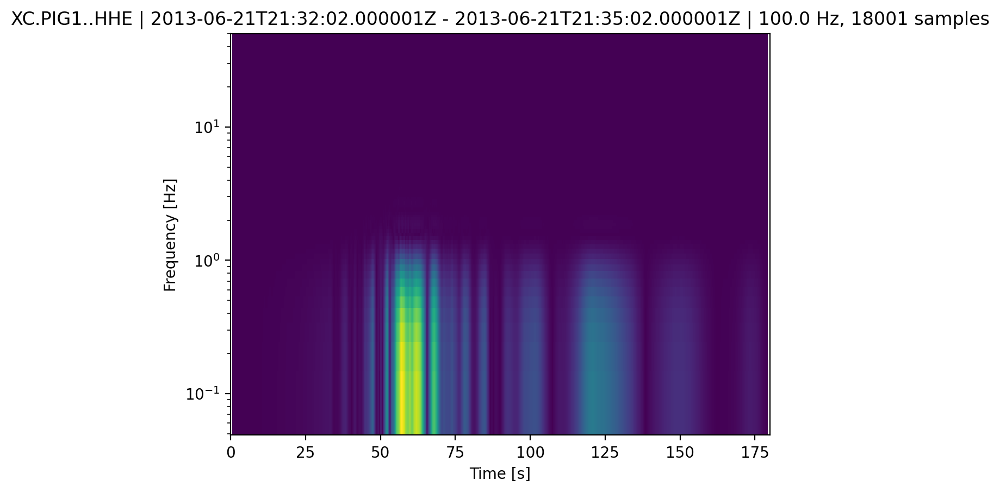

In [40]:
st[0].spectrogram(log=True)

In [41]:
# calculate the distance between two stations
from obspy.geodetics import gps2dist_azimuth

def distance(lat1, lon1, lat2, lon2):
    return gps2dist_azimuth(lat1, lon1, lat2, lon2)[0]/1000



In [42]:
for sta in inv.select(network='XC')[0]:
    print(sta.code)
    print(sta.latitude, sta.longitude)

PIG1
-75.016701 -100.748596
PIG2
-75.010696 -100.786598
PIG3
-75.009201 -100.730904
PIG4
-75.020302 -100.723701
PIG5
-75.020103 -100.802696


In [43]:
distance_2_to_4 = distance(
    inv.select(network='XC')[0][1].latitude,
    inv.select(network='XC')[0][1].longitude,
    inv.select(network='XC')[0][3].latitude,
    inv.select(network='XC')[0][3].longitude
)

distance_2_to_4

2.1089189492691416

In [44]:
tdiff_start_z = start_picks[0][3] - start_picks[0][1]
tdiff_start_n = start_picks[1][3] - start_picks[1][1]
tdiff_start_e = start_picks[2][3] - start_picks[2][1]

tdiff_peak_z = big_picks[0][3] - big_picks[0][1]
tdiff_peak_n = big_picks[1][3] - big_picks[1][1]
tdiff_peak_e = big_picks[2][3] - big_picks[2][1]

tdiffs = [tdiff_start_z, tdiff_start_n, tdiff_start_e, tdiff_peak_z, tdiff_peak_n, tdiff_peak_e]

NameError: name 'start_picks' is not defined

In [50]:
import statistics

In [ ]:
wavespeed_estimates = []

for i in range(len(tdiffs)):
    wavespeed_estimates.append(distance_2_to_4 / tdiffs[i])

wavespeed_mean = sum(wavespeed_estimates) / len(wavespeed_estimates)
wavespeed_std = statistics.stdev(wavespeed_estimates)

print(f'wavespeed estimates: {[f"{x:.2f}" for x in wavespeed_estimates]} km/s')
print(f'wavespeed mean: {wavespeed_mean:.2f} km/s')
print(f'wavespeed standard deviation: {wavespeed_std:.2f} km/s \n')
print(f'wavespeed : {wavespeed_mean - wavespeed_std:.2f} km/s to {wavespeed_mean + wavespeed_std:.2f} km/s')

wavespeed estimates: ['0.35', '1.05', '0.84', '0.43', '2.64', '2.11'] km/s
wavespeed mean: 1.24 km/s
wavespeed standard deviation: 0.93 km/s 

wavespeed : 0.31 km/s to 2.17 km/s


In [ ]:
# for sta in inv.select(network='XC')[0]:
#     m.scatter(sta.longitude, sta.latitude, c='b', s=10, latlon=True, marker='v')
#     x, y = np.array(m(sta.longitude, sta.latitude)) / 1e3 - (78, 68)
#     ax[1].plot(x, y, c='b', ms=7, marker='v', mec='k', mew=0.5)
#     ax[1].text(x, y+.1, sta.code, ha='center')
# ax[1].set(xlabel='x (km)', xlim=(-1.1, 1), ylabel='y (km)', ylim=(-1.1, 1.8))

In [ ]:
from obspy.clients.fdsn import Client
from pathlib import Path

for evtime in pig13.relocated_time:
    foname = Path(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping\XC_lf_%s.mseed" % evtime.strftime('%Y%m%d%H%M%S'))
    if foname.exists():
        print(f"Waveform data for {evtime} already exists, skipping download.")
        continue
    dstream = Client("IRIS").get_waveforms(network='XC', station='PIG*', location='*', channel='LH?', starttime=evtime-60, endtime=evtime + 120, attach_response=True)
    dstream.detrend('linear')
    dstream.remove_response(pre_filt=[0.001, 0.005, 0.8, 1.0])
    dstream.resample(20.0)
    dstream.write(foname, format='MSEED')

c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings

In [ ]:
for evtime in pig13.relocated_time:
    fname = Path(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping\XC_hf_%s.mseed" % evtime.strftime('%Y%m%d%H%M%S'))
    if fname.exists():
        print(f"Waveform data for {evtime} already exists, skipping download.")
        continue
    dstream = Client("IRIS").get_waveforms(network='XC', station='PIG*', location='*', channel='HH?', starttime=evtime-60, endtime=evtime + 120, attach_response=True)
    dstream.detrend('linear')
    dstream.remove_response(pre_filt=[0.1, 0.2, 40, 50])
    dstream.resample(20.0)
    dstream.write(fname, format='MSEED')

c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
c:\Users\thele\anaconda3\envs\base2\Lib\site-packages\obspy\io\mseed\core.py:773: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings

In [45]:
f_hf_name = Path('XC_hf_20130522122445.mseed')
f_lf_name = Path('XC_lf_20130522122445.mseed')

st_hf = read(f_hf_name)
st_lf = read(f_lf_name)

from obspy.signal.filter import bandpass

st_hf.filter('bandpass', freqmin=0.5, freqmax=9.9, corners=4, zerophase=True)
st_lf.filter('bandpass', freqmin=0.001, freqmax=1.0, corners=4, zerophase=True)

from numpy import array

# Ensure same length
data_combined = st_lf[0].data + st_hf[0].data


In [46]:
from obspy import Trace

# Create a new Trace using data_combined and st_hf[0]'s stats
new_trace = Trace(data=data_combined, header=st_hf[0].stats)

# Now new_trace.times() will match st_hf[0].times()

new_trace

XC.PIG1..HHE | 2013-05-22T12:23:45.000001Z - 2013-05-22T12:26:44.950001Z | 20.0 Hz, 3600 samples

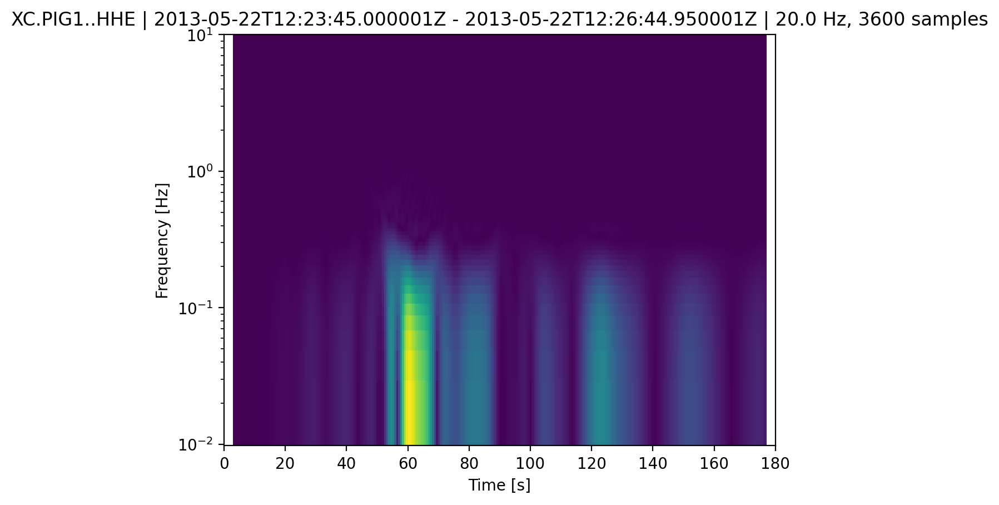

In [47]:
new_trace.spectrogram(log=True)

In [48]:
plot_fancy_normy(new_trace)

ValueError: max() arg is an empty sequence

In [49]:
import matplotlib.pyplot as plt
#from obspy.signal.spectrogram import spectrogram

nfft = 256  # Adjust depending on your frequency resolution needs
sampling_rate = st_hf[0].stats.sampling_rate

spectrogram(array(data_combined), samp_rate=sampling_rate, log=True, wlen=5)

plt.title("Combined HHZ + LHZ Spectrogram")
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [s]")
plt.colorbar(label="Amplitude")
plt.show()


NameError: name 'spectrogram' is not defined

## Looking for station within regional distance from the 2013 events

In [ ]:
inv13 = Client('IRIS').get_stations(channel='LHZ', latitude=-75, longitude=-99.5, minradius=0, maxradius=5,
                                    starttime=UTCDateTime('2013-01-01'), endtime=UTCDateTime('2014-01-01'))
# inv13.plot(projection='local')
# plt.show()

In [ ]:
# download waveform for of the station
for evtime in pig13.relocated_time:
    fname = Path('ALL_%s.mseed' % evtime.strftime('%Y%m%d%H%M%S'))
    if fname.exists():
        print(f"Waveform data for {evtime} already exists, skipping download.")
        continue

    bulk = []
    for net in inv13:
        for sta in net:
            bulk.append((net.code, sta.code, '*', 'LHZ', evtime-200, evtime+600))
    dstream = Client("IRIS").get_waveforms_bulk(bulk, attach_response=True)
    dstream.remove_response(output='DISP')
    dstream.write(fname, format='MSEED')

Waveform data for 2013-05-22T12:24:45.000000Z already exists, skipping download.
Waveform data for 2013-06-21T21:33:02.000000Z already exists, skipping download.
Waveform data for 2013-11-09T07:24:51.000000Z already exists, skipping download.
Waveform data for 2013-11-10T19:16:40.000000Z already exists, skipping download.
Waveform data for 2013-11-15T13:24:15.000000Z already exists, skipping download.
Waveform data for 2013-11-19T12:46:17.000000Z already exists, skipping download.
Waveform data for 2013-11-21T07:28:51.000000Z already exists, skipping download.
Waveform data for 2013-11-23T04:22:04.000000Z already exists, skipping download.


In [ ]:
# calculate the distance between two stations
def back_azimuth(lat1, lon1, lat2, lon2):
    return gps2dist_azimuth(lat1, lon1, lat2, lon2)[2]

def distance(lat1, lon1, lat2, lon2):
    return gps2dist_azimuth(lat1, lon1, lat2, lon2)[0]/1000

In [ ]:
dstream

10 Trace(s) in Stream:
XC.PIG1..LHZ | 2013-11-23T04:20:24.000001Z - 2013-11-23T04:30:24.000001Z | 1.0 Hz, 601 samples
XC.PIG2..LHZ | 2013-11-23T04:20:24.000000Z - 2013-11-23T04:30:24.000000Z | 1.0 Hz, 601 samples
XC.PIG3..LHZ | 2013-11-23T04:20:24.000000Z - 2013-11-23T04:30:24.000000Z | 1.0 Hz, 601 samples
XC.PIG4..LHZ | 2013-11-23T04:20:24.000000Z - 2013-11-23T04:30:24.000000Z | 1.0 Hz, 601 samples
XC.PIG5..LHZ | 2013-11-23T04:20:24.000000Z - 2013-11-23T04:30:24.000000Z | 1.0 Hz, 601 samples
YT.BEAR..LHZ | 2013-11-23T04:20:24.000000Z - 2013-11-23T04:30:24.000000Z | 1.0 Hz, 601 samples
YT.DNTW..LHZ | 2013-11-23T04:20:23.999998Z - 2013-11-23T04:30:23.999998Z | 1.0 Hz, 601 samples
YT.HOWD..LHZ | 2013-11-23T04:20:24.000009Z - 2013-11-23T04:30:24.000009Z | 1.0 Hz, 601 samples
YT.THUR..LHZ | 2013-11-23T04:20:23.999998Z - 2013-11-23T04:30:23.999998Z | 1.0 Hz, 601 samples
YT.UPTW..LHZ | 2013-11-23T04:20:24.000000Z - 2013-11-23T04:30:24.000000Z | 1.0 Hz, 601 samples

In [ ]:
inv13

Inventory created at 2025-09-12T04:04:40.971500Z
	Created by: IRIS WEB SERVICE: fdsnws-station | version: 1.1.52
		    http://service.iris.edu/fdsnws/station/1/query?starttime=2013-01-...
	Sending institution: IRIS-DMC (IRIS-DMC)
	Contains:
		Networks (2):
			XC, YT
		Stations (10):
			XC.PIG1 (Pine Island Glacier drill camp C)
			XC.PIG2 (Pine Island Glacier down glacier of C)
			XC.PIG3 (Pine Island Glacier Seismic northeast of C)
			XC.PIG4 (Pine Island Glacier Seismic between A and C)
			XC.PIG5 (Pine Island Glacier Seismic near crevasse)
			YT.BEAR (Bear Peninsula)
			YT.DNTW (Lower Thwaites Glacier)
			YT.HOWD (Howard Nunatak)
			YT.THUR (Thurston Island)
			YT.UPTW (UPTW)
		Channels (0):


In [ ]:
for station in inv13[0]:
    print(station.code)
    print(station.latitude, station.longitude)

PIG1
-75.016701 -100.748596
PIG2
-75.010696 -100.786598
PIG3
-75.009201 -100.730904
PIG4
-75.020302 -100.723701
PIG5
-75.020103 -100.802696


In [ ]:
distances_stations = [35.4, 35.6, 36.1, 37.2, 37.7, 279, 282, 365, 382, 438]
arrival_times = []
for i in range(len(distances_stations)):
    arrival_times.append(distances_stations[i] / 2.95) 

# ax[0, c].plot(start_picks[c][s], s, marker='|', markersize=35, markeredgecolor='k', markerfacecolor='none')
arrival_times

[11.999999999999998,
 12.067796610169491,
 12.23728813559322,
 12.610169491525424,
 12.779661016949152,
 94.57627118644068,
 95.59322033898304,
 123.72881355932202,
 129.4915254237288,
 148.47457627118644]

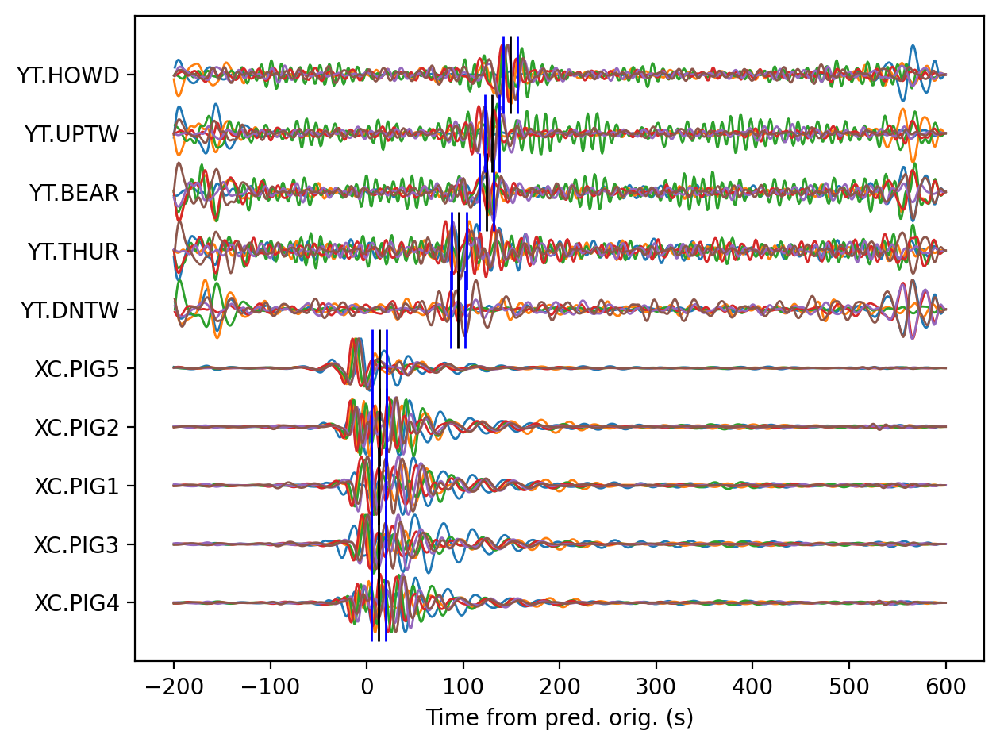

In [ ]:
from obspy.geodetics import gps2dist_azimuth

stats = ['XC.PIG4', 'XC.PIG3', 'XC.PIG1', 'XC.PIG2', 'XC.PIG5', 'YT.DNTW', 'YT.THUR', 'YT.BEAR', 'YT.UPTW', 'YT.HOWD']
# for net in inv13:
#     for sta in net:
#         stats.append(f'{net.code}.{sta.code}')

fig, ax = plt.subplots()
for e, fname in enumerate(sorted(Path(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping").glob('ALL_201311*.mseed'))):
    evtime = UTCDateTime.strptime(fname.name, 'ALL_%Y%m%d%H%M%S.mseed')
    dstream = read(fname)

    dstream.detrend('linear')
    dstream.taper(max_percentage=0.05, type='cosine')
    # dstream.filter('bandpass', freqmin=1/25, freqmax=1/17, corners=4, zerophase=True)
    dstream.filter('bandpass', freqmin=0.03, freqmax=0.10, corners=4, zerophase=True)
    #dstream.trim(evtime-100, evtime+500)
    evla, evlo = -75, -99.5

    for tr in dstream:
        tmp = inv13.select(network=tr.stats.network, station=tr.stats.station)[0][0]
        dist, az, baz = gps2dist_azimuth(evla, evlo, tmp.latitude, tmp.longitude)
        dist /= 1e3
        # if dist > 400: continue
        s = stats.index(f'{tr.stats.network}.{tr.stats.station}')
        ax.plot(tr.stats.starttime - evtime + tr.times(), .5*tr.data/np.max(np.abs(tr.data)) + s, 
                label=tr.id, lw=1, c=f'C{e}')
        if e == len(sorted(Path(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping").glob('ALL_201311*.mseed'))) - 1:
            ax.plot(arrival_times[s], s, marker='|', markersize=35, markeredgecolor='k', markerfacecolor='none')
            ax.plot(arrival_times[s]-(15/2), s, marker='|', markersize=35, markeredgecolor='b', markerfacecolor='none')
            ax.plot(arrival_times[s]+(15/2), s, marker='|', markersize=35, markeredgecolor='b', markerfacecolor='none')

#ax.set(xlim=(-100, 100))
ax.set(yticks=range(len(stats)), yticklabels=stats, xlabel='Time from pred. orig. (s)')

fig.tight_layout()
plt.show()

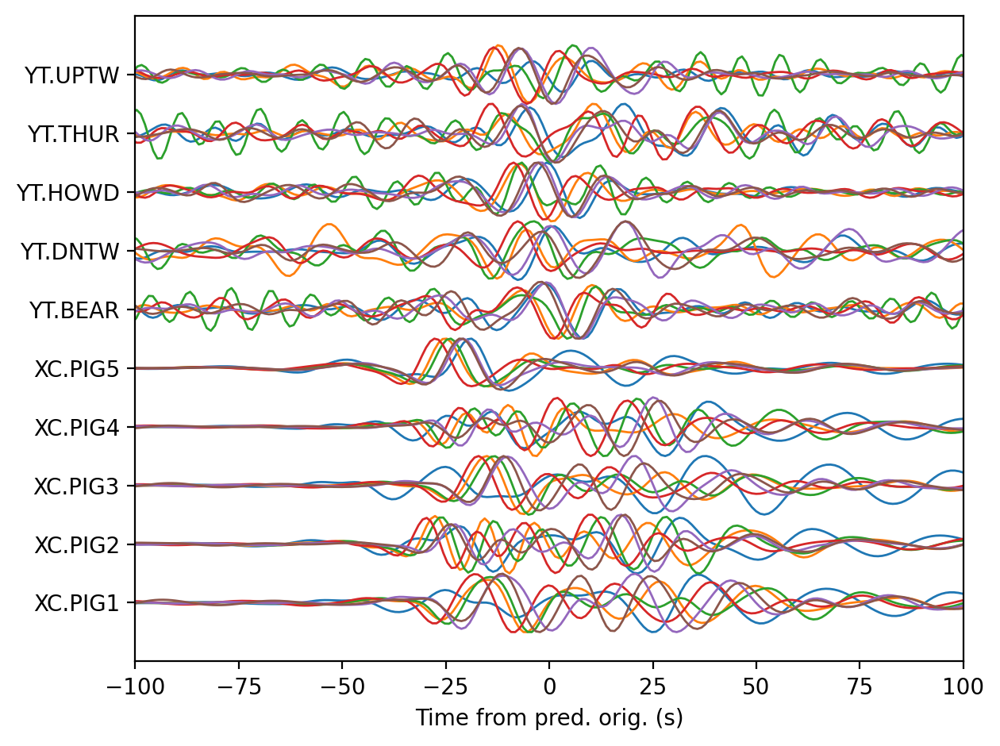

In [ ]:
from obspy.geodetics import gps2dist_azimuth

stats = []
for net in inv13:
    for sta in net:
        stats.append(f'{net.code}.{sta.code}')

fig, ax = plt.subplots()
for e, fname in enumerate(sorted(Path(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\Mapping").glob('ALL_201311*.mseed'))):
    evtime = UTCDateTime.strptime(fname.name, 'ALL_%Y%m%d%H%M%S.mseed')
    dstream = read(fname)

    dstream.detrend('linear')
    dstream.taper(max_percentage=0.05, type='cosine')
    # dstream.filter('bandpass', freqmin=1/25, freqmax=1/17, corners=4, zerophase=True)
    dstream.filter('bandpass', freqmin=0.03, freqmax=0.10, corners=4, zerophase=True)
    dstream.trim(evtime-100, evtime+500)
    evla, evlo = -75, -99.5

    for tr in dstream:
        tmp = inv13.select(network=tr.stats.network, station=tr.stats.station)[0][0]
        dist, az, baz = gps2dist_azimuth(evla, evlo, tmp.latitude, tmp.longitude)
        dist /= 1e3
        # if dist > 400: continue
        s = stats.index(f'{tr.stats.network}.{tr.stats.station}')
        ax.plot(tr.stats.starttime - evtime + tr.times() - dist / 2.95, .5*tr.data/np.max(np.abs(tr.data)) + s, 
                label=tr.id, lw=1, c=f'C{e}')

ax.set(xlim=(-100, 100))
ax.set(yticks=range(len(stats)), yticklabels=stats, xlabel='Time from pred. orig. (s)')

fig.tight_layout()
plt.show()

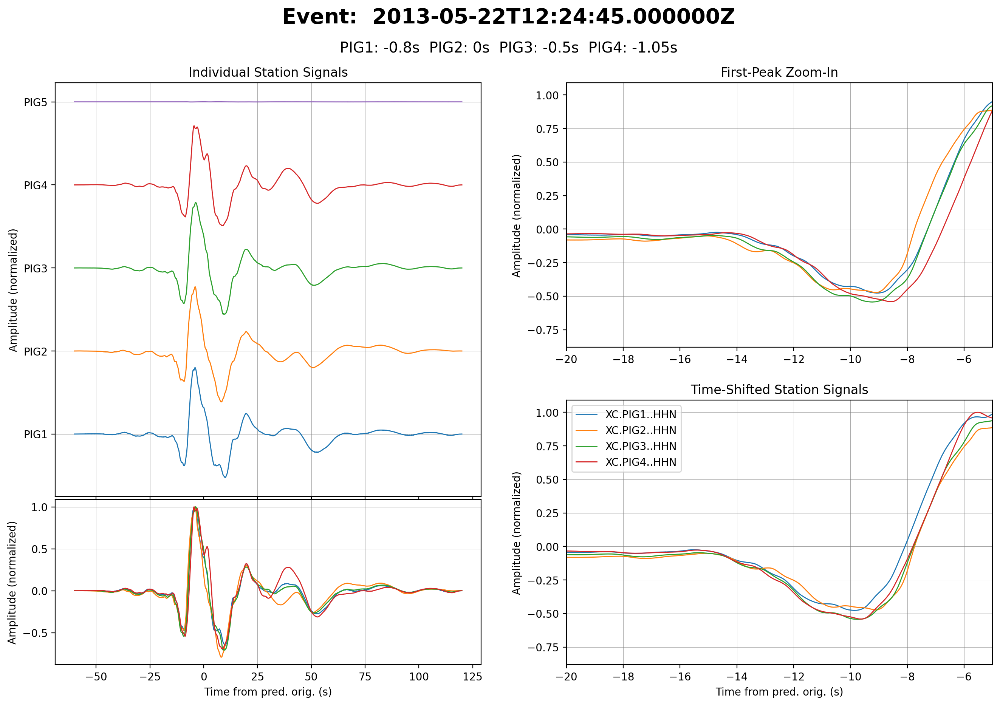

In [ ]:
fname = Path(event_paths[0])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.8, 0, -0.5, -1.05, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-20, -5))
ax_right_bottom.set_xlim((-20, -5))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

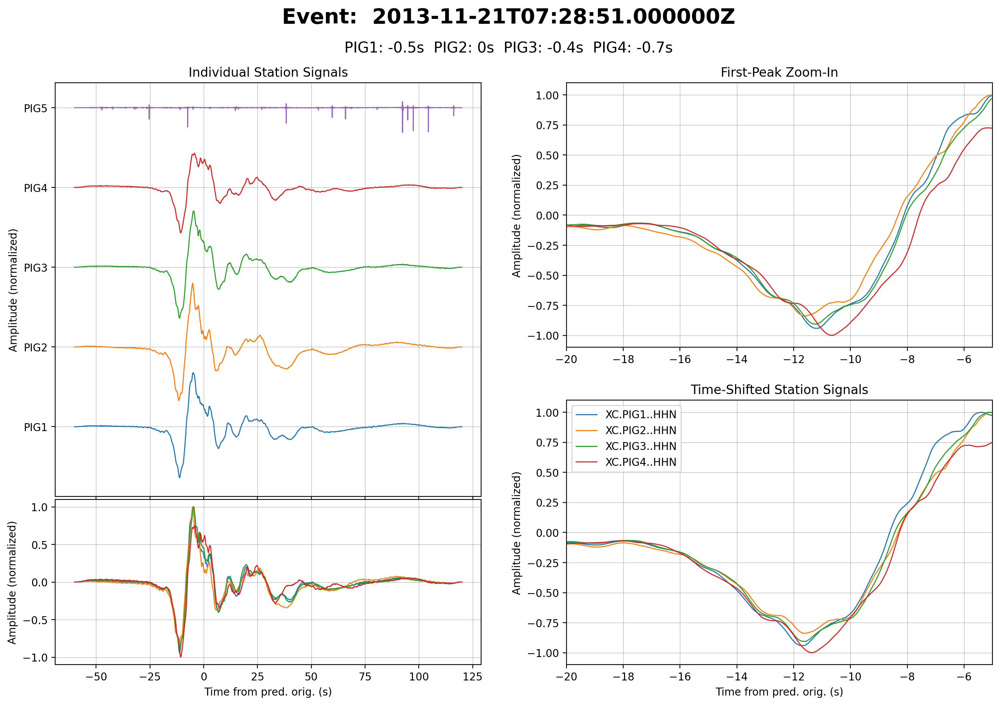

In [ ]:
fname = Path(event_paths[1])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.5, 0, -0.4, -0.7, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-20, -5))
ax_right_bottom.set_xlim((-20, -5))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

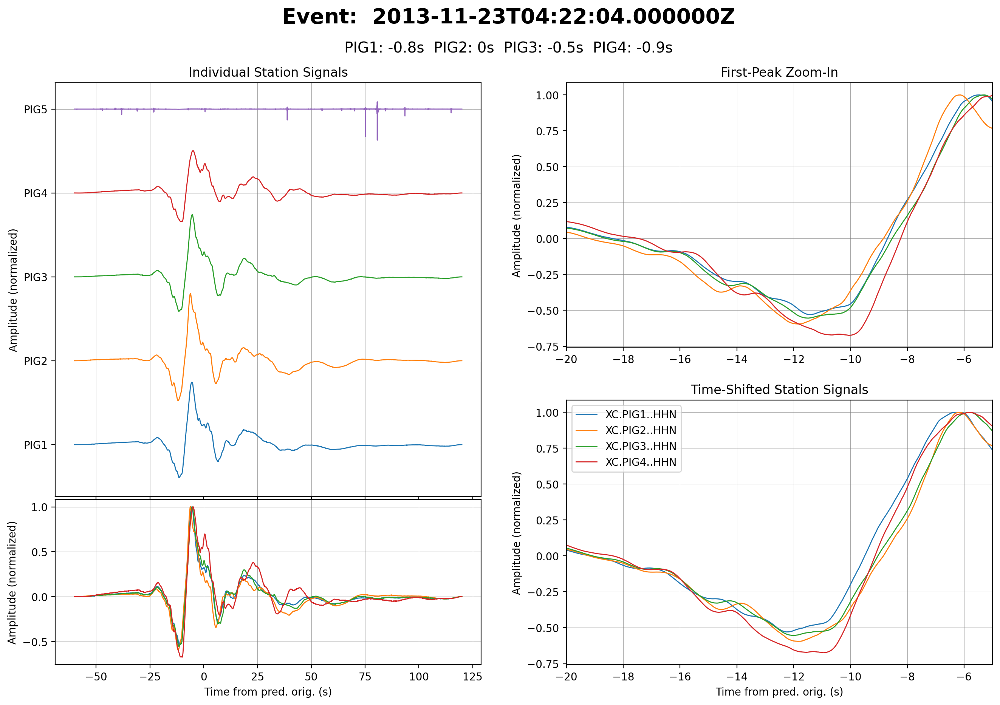

In [ ]:
fname = Path(event_paths[2])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.8, 0, -0.5, -0.9, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-20, -5))
ax_right_bottom.set_xlim((-20, -5))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

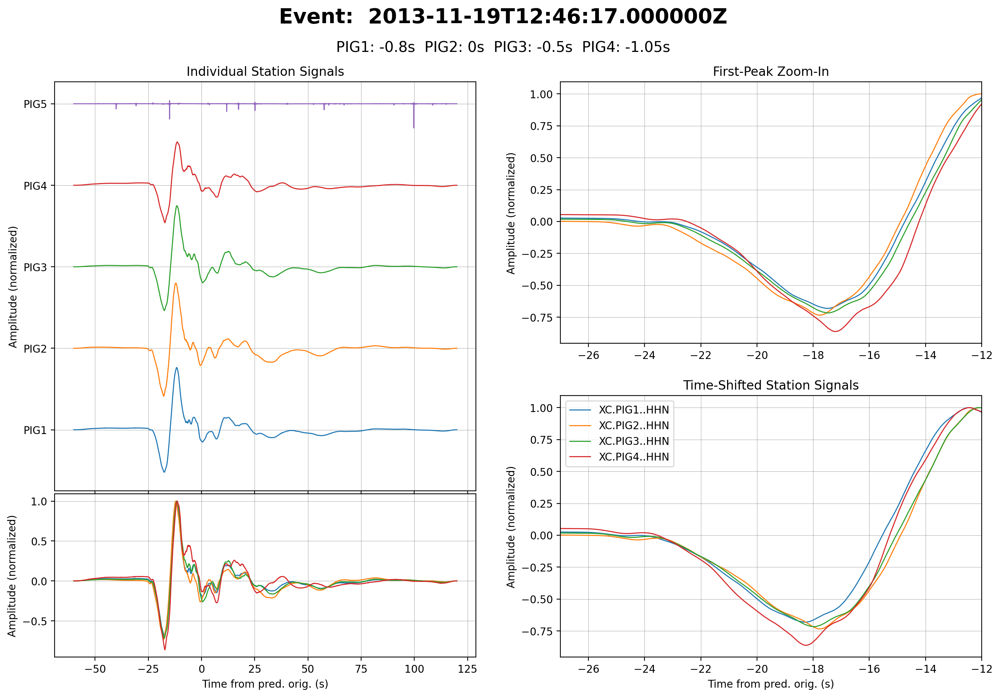

In [ ]:
fname = Path(event_paths[3])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.8, 0, -0.5, -1.05, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-27, -12))
ax_right_bottom.set_xlim((-27, -12))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

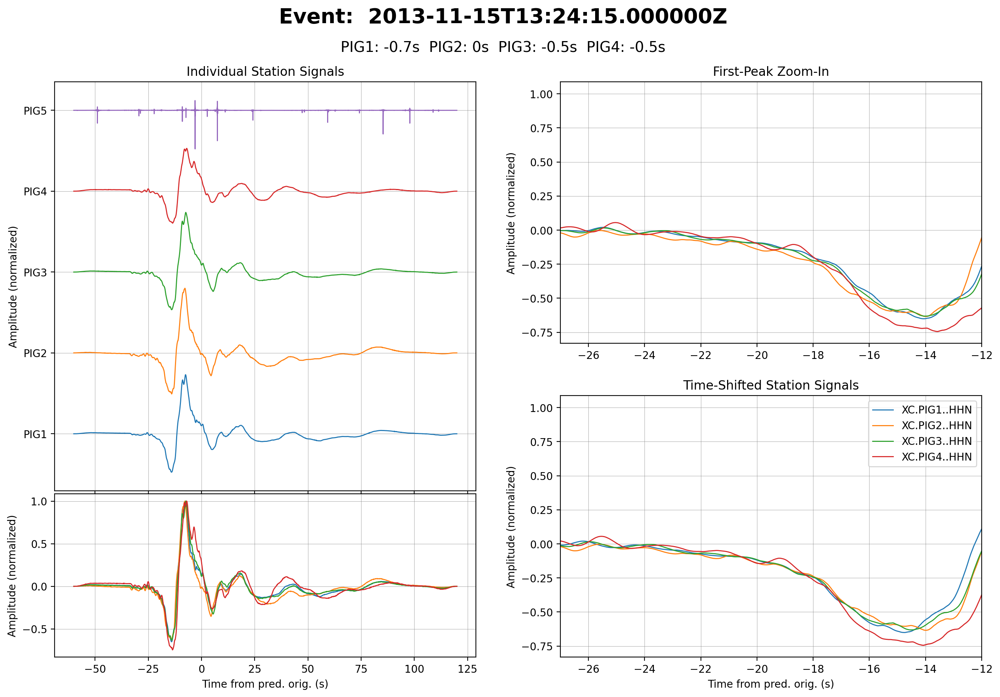

In [ ]:
fname = Path(event_paths[4])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.7, 0, -0.5, -0.5, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-27, -12))
ax_right_bottom.set_xlim((-27, -12))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

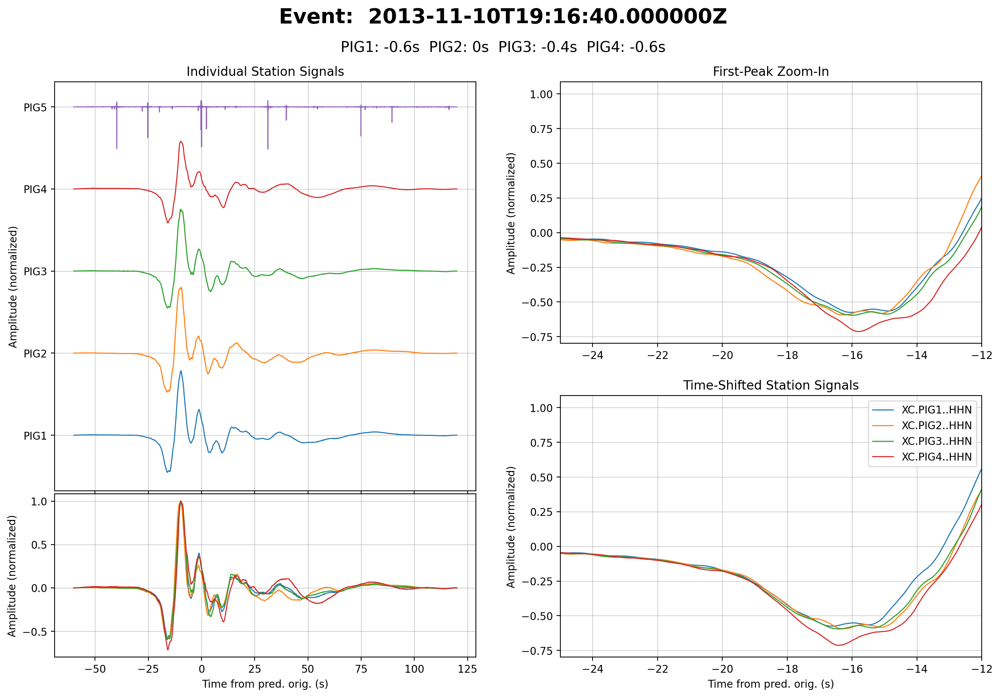

In [ ]:
fname = Path(event_paths[5])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.6, 0, -0.4, -0.6, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-25, -12))
ax_right_bottom.set_xlim((-25, -12))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

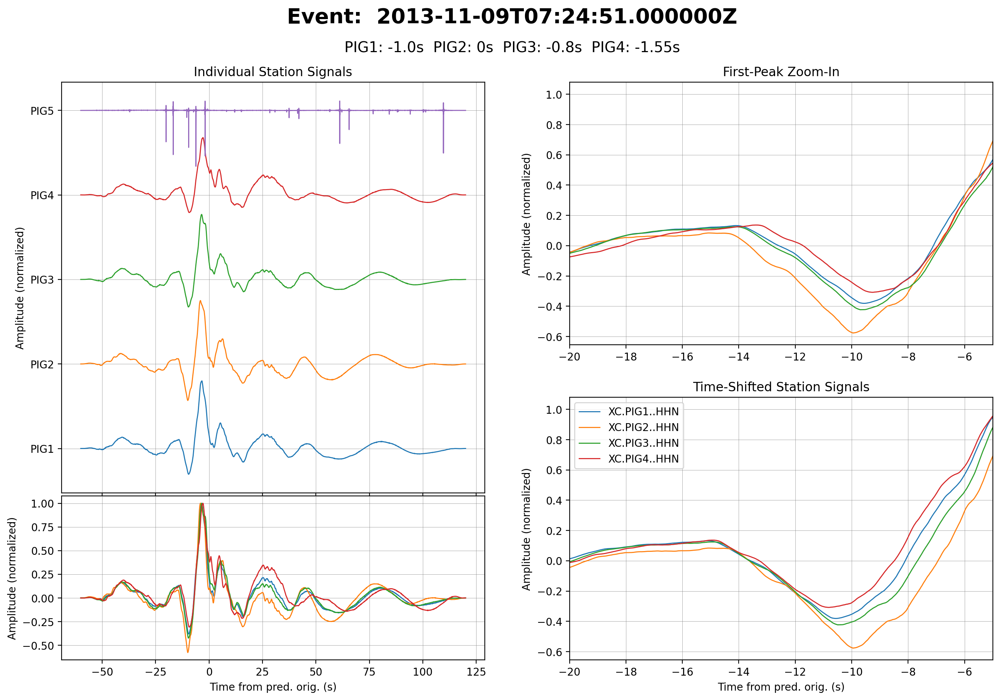

In [ ]:
fname = Path(event_paths[6])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-1.0, 0, -0.8, -1.55, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-20, -5))
ax_right_bottom.set_xlim((-20, -5))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

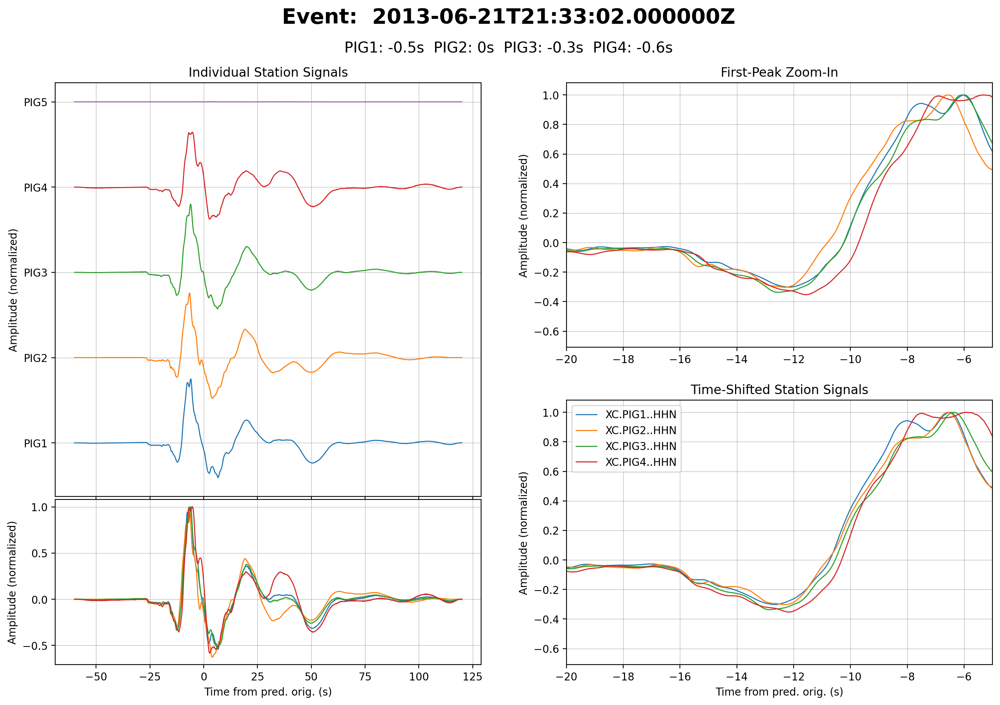

In [ ]:
fname = Path(event_paths[7])
evtime = UTCDateTime.strptime(fname.name, 'XC_%Y%m%d%H%M%S.mseed')
st = read(fname)
st.taper(max_percentage=0.05, type='cosine')
vmax = .8/np.max([np.max(np.abs(tr.data)) for tr in st])

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

gs_left = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 0], height_ratios=[1, 0.4], hspace=0.01)
ax_left_top = fig.add_subplot(gs_left[0])
ax_left_bottom = fig.add_subplot(gs_left[1])

gs_right = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[:, 1], height_ratios=[1, 1])
ax_right_top = fig.add_subplot(gs_right[0])
ax_right_bottom = fig.add_subplot(gs_right[1])

t_offsets = [-0.5, 0, -0.3, -0.6, 0]

for s in range(5):
    tr = st.select(component='ZNE'[1], station='PIG%01d' % (s + 1))[0]
    tvec = tr.stats.starttime - evtime + tr.times()
    tvec2 = tr.stats.starttime - evtime + tr.times() + t_offsets[s]
    ax_left_top.plot(tvec, tr.data*vmax + s, label=tr.id, lw=1)
    if s < 4:
        _ = 1 / np.max(np.abs(tr.data))
        ax_left_bottom.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_top.plot(tvec, tr.data*_, label=tr.id, lw=1)
        ax_right_bottom.plot(tvec2, tr.data*_, label=tr.id, lw=1)

ax_right_top.set_xlim((-20, -5))
ax_right_bottom.set_xlim((-20, -5))

ax_left_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_bottom.set(xlabel='Time from pred. orig. (s)', ylabel='Amplitude (normalized)')
ax_right_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(ylabel='Amplitude (normalized)')
ax_left_top.set(yticks=range(5), yticklabels=['PIG%01d' % (s + 1) for s in range(5)])

ax_left_top.grid(lw=.25, c='gray')
ax_left_bottom.grid(lw=.25, c='gray')
ax_right_top.grid(lw=.25, c='gray')
ax_right_bottom.grid(lw=.25, c='gray')

# Example usage:
ax_left_top.set_title("Individual Station Signals")
ax_right_top.set_title("First-Peak Zoom-In")
ax_right_bottom.set_title("Time-Shifted Station Signals")

ax_left_top.xaxis.set_major_formatter(NullFormatter())

fig.suptitle(f"Event:  {evtime}", fontsize=20, fontweight='bold', x=0.5, y=0.98)
fig.text(0.5, 0.92, f"PIG1: {t_offsets[0]}s  PIG2: {t_offsets[1]}s  PIG3: {t_offsets[2]}s  PIG4: {t_offsets[3]}s", fontsize=14, ha='center')

plt.legend()

#plt.tight_layout()
plt.show()

In [ ]:
t_offsets_list_up = [
    [-0.5, 0, -0.5, -1.05, 0],
    [-0.3, 0, -0.3, -0.8, 0],
    [-0.05, 0, -0.3, -0.5, 0],
    [-0.3, 0, -0.45, -0.75, 0],
    [-0.2, 0, -0.3, -0.6, 0],
    [-0.3, 0, -0.35, -0.8, 0],
    [0.1, 0, -0.1, 0, 0],
    [-0.3, 0, -0.4, -0.8, 0]
]

t_offsets_list_down = [
    [-0.8, 0, -0.5, -1.05, 0],
    [-0.5, 0, -0.4, -0.7, 0],
    [-0.8, 0, -0.5, -0.9, 0],
    [-0.8, 0, -0.5, -1.05, 0],
    [-0.7, 0, -0.5, -0.5, 0],
    [-0.6, 0, -0.4, -0.6, 0],
    [-1.0, 0, -0.8, -1.55, 0],
    [-0.5, 0, -0.3, -0.6, 0]
]

In [ ]:
from obspy.geodetics import gps2dist_azimuth

def distance(lat1, lon1, lat2, lon2):
    return gps2dist_azimuth(lat1, lon1, lat2, lon2)[0]/1000

distance_2_to_4 = distance(
    inv.select(network='XC')[0][1].latitude,
    inv.select(network='XC')[0][1].longitude,
    inv.select(network='XC')[0][3].latitude,
    inv.select(network='XC')[0][3].longitude
)

tdiff_start_1_up = t_offsets_list_up[0][3] - t_offsets_list_up[0][1]
tdiff_start_2_up = t_offsets_list_up[1][3] - t_offsets_list_up[1][1]
tdiff_start_3_up = t_offsets_list_up[2][3] - t_offsets_list_up[2][1]
tdiff_start_4_up = t_offsets_list_up[3][3] - t_offsets_list_up[3][1]
tdiff_start_5_up = t_offsets_list_up[4][3] - t_offsets_list_up[4][1]
tdiff_start_6_up = t_offsets_list_up[5][3] - t_offsets_list_up[5][1]
tdiff_start_7_up = t_offsets_list_up[6][3] - t_offsets_list_up[6][1]
tdiff_start_8_up = t_offsets_list_up[7][3] - t_offsets_list_up[7][1]

tdiffs_up = [tdiff_start_1_up, tdiff_start_2_up, tdiff_start_3_up, tdiff_start_4_up, tdiff_start_5_up, tdiff_start_6_up, tdiff_start_7_up, tdiff_start_8_up]

tdiff_start_1_down = t_offsets_list_down[0][3] - t_offsets_list_down[0][1]
tdiff_start_2_down = t_offsets_list_down[1][3] - t_offsets_list_down[1][1]
tdiff_start_3_down = t_offsets_list_down[2][3] - t_offsets_list_down[2][1]
tdiff_start_4_down = t_offsets_list_down[3][3] - t_offsets_list_down[3][1]
tdiff_start_5_down = t_offsets_list_down[4][3] - t_offsets_list_down[4][1]
tdiff_start_6_down = t_offsets_list_down[5][3] - t_offsets_list_down[5][1]
tdiff_start_7_down = t_offsets_list_down[6][3] - t_offsets_list_down[6][1]
tdiff_start_8_down = t_offsets_list_down[7][3] - t_offsets_list_down[7][1]

tdiffs_down = [tdiff_start_1_down, tdiff_start_2_down, tdiff_start_3_down, tdiff_start_4_down, tdiff_start_5_down, tdiff_start_6_down, tdiff_start_7_down, tdiff_start_8_down]


import statistics

wavespeed_estimates_up, wavespeed_estimates_down, wavespeed_estimates = [], [], []

for i in range(len(tdiffs_up)):
    wavespeed_estimate_up = distance_2_to_4 / tdiffs_up[i] if tdiffs_up[i] != 0 else 0
    wavespeed_estimates_up.append(wavespeed_estimate_up)
    wavespeed_estimates.append(wavespeed_estimate_up)

for i in range(len(tdiffs_down)):
    wavespeed_estimate_down = distance_2_to_4 / tdiffs_down[i] if tdiffs_down[i] != 0 else 0
    wavespeed_estimates_down.append(wavespeed_estimate_down)
    wavespeed_estimates.append(wavespeed_estimate_down)

wavespeed_mean_up = sum(wavespeed_estimates_up) / len(wavespeed_estimates_up)
wavespeed_std_up = statistics.stdev(wavespeed_estimates_up)
wavespeed_mean_down = sum(wavespeed_estimates_down) / len(wavespeed_estimates_down)
wavespeed_std_down = statistics.stdev(wavespeed_estimates_down)
wavespeed_mean = sum(wavespeed_estimates) / len(wavespeed_estimates)
wavespeed_std = statistics.stdev(wavespeed_estimates)

print(f'wavespeed estimates up: {[f"{x:.2f}" for x in wavespeed_estimates]} km/s')
print(f'wavespeed mean up: {wavespeed_mean_up:.2f} km/s')
print(f'wavespeed standard deviation up: {wavespeed_std_up:.2f} km/s')
print(f'wavespeed up: {wavespeed_mean_up - wavespeed_std_up:.2f} km/s to {wavespeed_mean_up + wavespeed_std_up:.2f} km/s \n')

print(f'wavespeed estimates down: {[f"{x:.2f}" for x in wavespeed_estimates_down]} km/s')
print(f'wavespeed mean down: {wavespeed_mean_down:.2f} km/s')
print(f'wavespeed standard deviation down: {wavespeed_std_down:.2f} km/s')
print(f'wavespeed down: {wavespeed_mean_down - wavespeed_std_down:.2f} km/s to {wavespeed_mean_down + wavespeed_std_down:.2f} km/s \n')

print(f'wavespeed estimates: {[f"{x:.2f}" for x in wavespeed_estimates]} km/s')
print(f'wavespeed mean: {wavespeed_mean:.2f} km/s')
print(f'wavespeed standard deviation: {wavespeed_std:.2f} km/s \n')
print(f'wavespeed : {wavespeed_mean - wavespeed_std:.2f} km/s to {wavespeed_mean + wavespeed_std:.2f} km/s')

wavespeed estimates up: ['-2.01', '-2.64', '-4.22', '-2.81', '-3.51', '-2.64', '0.00', '-2.64', '-2.01', '-3.01', '-2.34', '-2.01', '-4.22', '-3.51', '-1.36', '-3.51'] km/s
wavespeed mean up: -2.56 km/s
wavespeed standard deviation up: 1.23 km/s
wavespeed up: -3.79 km/s to -1.33 km/s 

wavespeed estimates down: ['-2.01', '-3.01', '-2.34', '-2.01', '-4.22', '-3.51', '-1.36', '-3.51'] km/s
wavespeed mean down: -2.75 km/s
wavespeed standard deviation down: 0.97 km/s
wavespeed down: -3.72 km/s to -1.78 km/s 

wavespeed estimates: ['-2.01', '-2.64', '-4.22', '-2.81', '-3.51', '-2.64', '0.00', '-2.64', '-2.01', '-3.01', '-2.34', '-2.01', '-4.22', '-3.51', '-1.36', '-3.51'] km/s
wavespeed mean: -2.65 km/s
wavespeed standard deviation: 1.07 km/s 

wavespeed : -3.73 km/s to -1.58 km/s
